In [131]:
%pip install Prophet 

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error
from datetime import timedelta, date
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")
    

In [133]:

# Load data
df = pd.read_excel("Hotel_Revenue_Data.xlsx")

# Basic cleanup
df['Date'] = pd.to_datetime(df['Date'])
df['CheckTotal'] = pd.to_numeric(df['CheckTotal'], errors='coerce')
df = df.dropna(subset=['CheckTotal'])
    

In [134]:
#Find ISO holidays in Dubai for 2025

import holidays

# Get Dubai holidays for 2025
dubai_holidays = holidays.UnitedArabEmirates(years=2024)

# Print all holiday dates and names
for day, name in dubai_holidays.items():
    print(f"{day} ({day.isocalendar()}): {name}")

2024-01-01 (datetime.IsoCalendarDate(year=2024, week=1, weekday=1)): رأس السنة الميلادية
2024-12-02 (datetime.IsoCalendarDate(year=2024, week=49, weekday=1)): اليوم الوطني
2024-12-03 (datetime.IsoCalendarDate(year=2024, week=49, weekday=2)): اليوم الوطني
2024-04-10 (datetime.IsoCalendarDate(year=2024, week=15, weekday=3)): عيد الفطر
2024-04-11 (datetime.IsoCalendarDate(year=2024, week=15, weekday=4)): عطلة عيد الفطر
2024-04-12 (datetime.IsoCalendarDate(year=2024, week=15, weekday=5)): عطلة عيد الفطر
2024-04-09 (datetime.IsoCalendarDate(year=2024, week=15, weekday=2)): عطلة عيد الفطر
2024-06-15 (datetime.IsoCalendarDate(year=2024, week=24, weekday=6)): وقفة عرفة
2024-06-16 (datetime.IsoCalendarDate(year=2024, week=24, weekday=7)): عيد الأضحى
2024-06-17 (datetime.IsoCalendarDate(year=2024, week=25, weekday=1)): عطلة عيد الأضحى
2024-06-18 (datetime.IsoCalendarDate(year=2024, week=25, weekday=2)): عطلة عيد الأضحى
2024-07-07 (datetime.IsoCalendarDate(year=2024, week=27, weekday=7)): رأس الس

In [135]:
df

,Date,MealPeriod,CheckTotal,RevenueCenterName
0,2023-04-18,Dinner,125.0,RevenueCenter_1
1,2023-04-18,Dinner,37.5,RevenueCenter_1
2,2023-04-18,Dinner,0.0,RevenueCenter_1
3,2023-04-18,Dinner,0.0,RevenueCenter_1
4,2023-04-18,Dinner,70.0,RevenueCenter_2
...,...,...,...,...
120557,2024-04-14,Lunch,40.0,RevenueCenter_5
120558,2024-04-14,Dinner,282.0,RevenueCenter_5
120559,2024-04-14,Lunch,166.0,RevenueCenter_5
120560,2024-04-14,Dinner,180.0,RevenueCenter_5


In [136]:
df[df["RevenueCenterName"] == "RevenueCenter_4"]["CheckTotal"].unique()

array([0. , 0.1])

In [137]:
df[df["RevenueCenterName"] == "RevenueCenter_4"].info()

<class 'pandas.core.frame.DataFrame'>
Index: 1617 entries, 55 to 120457
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               1617 non-null   datetime64[ns]
 1   MealPeriod         1617 non-null   object        
 2   CheckTotal         1617 non-null   float64       
 3   RevenueCenterName  1617 non-null   object        
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 63.2+ KB


In [138]:
df[df["RevenueCenterName"] == "RevenueCenter_4"].describe()

,Date,CheckTotal
count,1617,1617.000000
mean,2023-09-24 23:15:28.385899776,0.000062
min,2023-01-01 00:00:00,0.000000
25%,2023-05-29 00:00:00,0.000000
50%,2023-10-10 00:00:00,0.000000
75%,2024-02-03 00:00:00,0.000000
max,2024-04-30 00:00:00,0.100000
std,NaN,0.002487


In [139]:
df["CheckTotal"].describe()

count    120562.000000
mean        272.076133
std        1472.419857
min           0.000000
25%           5.000000
50%          60.000000
75%         155.000000
max       69000.000000
Name: CheckTotal, dtype: float64

In [140]:
df[df["CheckTotal"] > 0]

,Date,MealPeriod,CheckTotal,RevenueCenterName
0,2023-04-18,Dinner,125.0,RevenueCenter_1
1,2023-04-18,Dinner,37.5,RevenueCenter_1
4,2023-04-18,Dinner,70.0,RevenueCenter_2
5,2023-04-18,Dinner,35.0,RevenueCenter_2
7,2023-04-18,BreakFast,17.5,RevenueCenter_2
...,...,...,...,...
120557,2024-04-14,Lunch,40.0,RevenueCenter_5
120558,2024-04-14,Dinner,282.0,RevenueCenter_5
120559,2024-04-14,Lunch,166.0,RevenueCenter_5
120560,2024-04-14,Dinner,180.0,RevenueCenter_5


In [141]:
df[(df["RevenueCenterName"] == "RevenueCenter_4") & (df["CheckTotal"] > 0)]


,Date,MealPeriod,CheckTotal,RevenueCenterName
6921,2023-02-03,Dinner,0.1,RevenueCenter_4


In [142]:
df = df[df["RevenueCenterName"] != "RevenueCenter_4"]

In [143]:
df["RevenueCenterName"].unique()

array(['RevenueCenter_1', 'RevenueCenter_2', 'RevenueCenter_3',
       'RevenueCenter_5', 'RevenueCenter_6', 'RevenueCenter_7',
       'RevenueCenter_8', 'RevenueCenter_9'], dtype=object)

In [144]:
df[df["CheckTotal"] <= 0]["CheckTotal"]

2         0.0
3         0.0
6         0.0
8         0.0
9         0.0
         ... 
120520    0.0
120523    0.0
120530    0.0
120540    0.0
120545    0.0
Name: CheckTotal, Length: 26167, dtype: float64

In [145]:

# Extract time features
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Month'] = df['Date'].dt.month
df['Week'] = df['Date'].dt.isocalendar().week



In [146]:
df[(df['CheckTotal'] == 0) & (df['DayOfWeek'] == 4)]


,Date,MealPeriod,CheckTotal,RevenueCenterName,DayOfWeek,Month,Week
370,2023-01-27,Dinner,0.0,RevenueCenter_3,4,1,4
377,2023-01-27,Dinner,0.0,RevenueCenter_1,4,1,4
425,2023-01-27,Dinner,0.0,RevenueCenter_3,4,1,4
436,2023-01-27,BreakFast,0.0,RevenueCenter_5,4,1,4
451,2023-01-27,Lunch,0.0,RevenueCenter_5,4,1,4
...,...,...,...,...,...,...,...
120381,2024-04-26,BreakFast,0.0,RevenueCenter_1,4,4,17
120385,2024-04-26,Dinner,0.0,RevenueCenter_1,4,4,17
120392,2024-04-26,Dinner,0.0,RevenueCenter_1,4,4,17
120393,2024-04-26,Dinner,0.0,RevenueCenter_1,4,4,17


In [147]:

# Group data by date, meal period, and revenue center
grouped = df.groupby(['Date', 'MealPeriod', 'RevenueCenterName'])['CheckTotal'].sum().reset_index()
# Extract time features
grouped['DayOfWeek'] = grouped['Date'].dt.dayofweek
grouped['Month'] = grouped['Date'].dt.month
grouped['Week'] = grouped['Date'].dt.isocalendar().week

In [148]:
import pandas as pd
import holidays

# Step 1: Generate list of holidays (UAE example; adjust as needed)
uae_holidays = holidays.UnitedArabEmirates(years=[2023, 2024])

# Step 2: Filter relevant dates
grouped['Date'] = pd.to_datetime(grouped['Date'])
holiday_dict = {}

# Step 3: Iterate through combinations
for meal in grouped['MealPeriod'].unique():
    for center in grouped['RevenueCenterName'].unique():
        combo_df = grouped[(grouped['MealPeriod'] == meal) &
                           (grouped['RevenueCenterName'] == center)]
        combo_df['Holiday'] = combo_df['Date'].map(uae_holidays)  # Returns holiday name or NaN
        holiday_rows = combo_df[combo_df['Holiday'].notna()]
        
        # Create key: ex. Lunch_2
        center_num = center.split("_")[-1]
        key = f"{meal}_{center_num}"
        
        holiday_dict[key] = holiday_rows.reset_index(drop=True)


In [197]:
holiday_dict

{'BreakFast_1':          Date MealPeriod RevenueCenterName  CheckTotal  DayOfWeek  Month  \
 0  2023-01-01  BreakFast   RevenueCenter_1     1499.40          6      1   
 1  2023-04-20  BreakFast   RevenueCenter_1      753.00          3      4   
 2  2023-04-21  BreakFast   RevenueCenter_1      408.00          4      4   
 3  2023-04-22  BreakFast   RevenueCenter_1      544.00          5      4   
 4  2023-04-23  BreakFast   RevenueCenter_1      518.00          6      4   
 5  2023-06-27  BreakFast   RevenueCenter_1      812.00          1      6   
 6  2023-06-28  BreakFast   RevenueCenter_1     1648.00          2      6   
 7  2023-06-29  BreakFast   RevenueCenter_1     1373.00          3      6   
 8  2023-06-30  BreakFast   RevenueCenter_1     1935.00          4      6   
 9  2023-07-21  BreakFast   RevenueCenter_1     1301.90          4      7   
 10 2023-09-29  BreakFast   RevenueCenter_1      506.00          4      9   
 11 2023-12-01  BreakFast   RevenueCenter_1     1437.00      

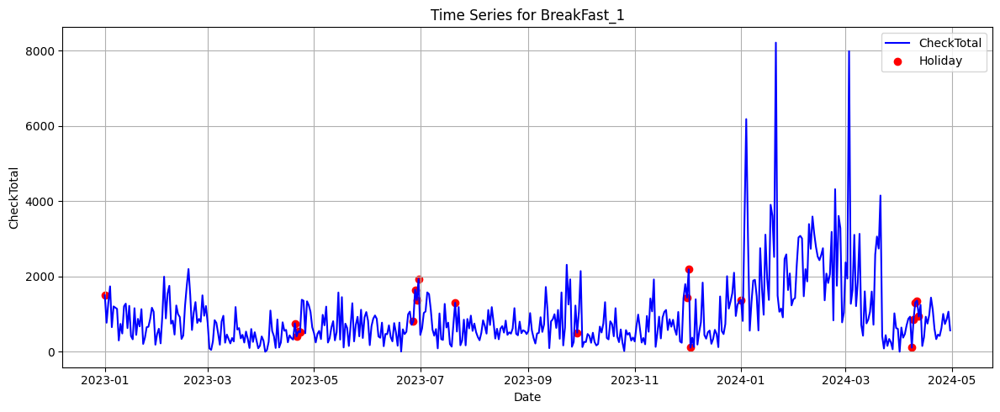

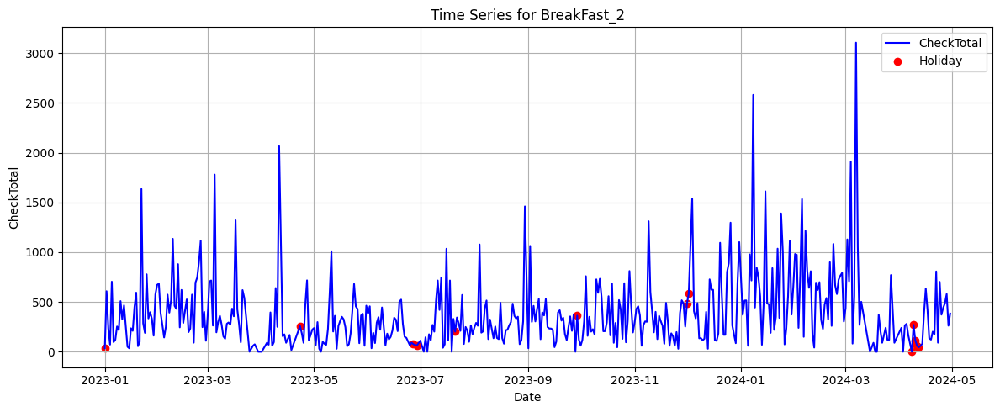

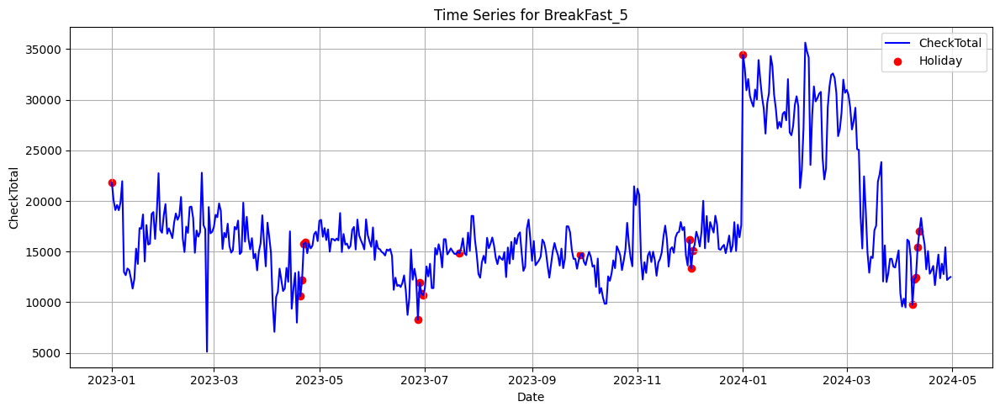

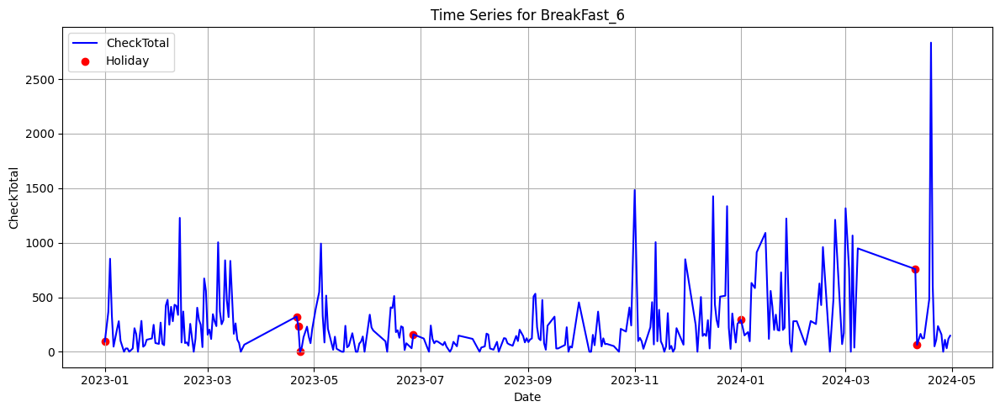

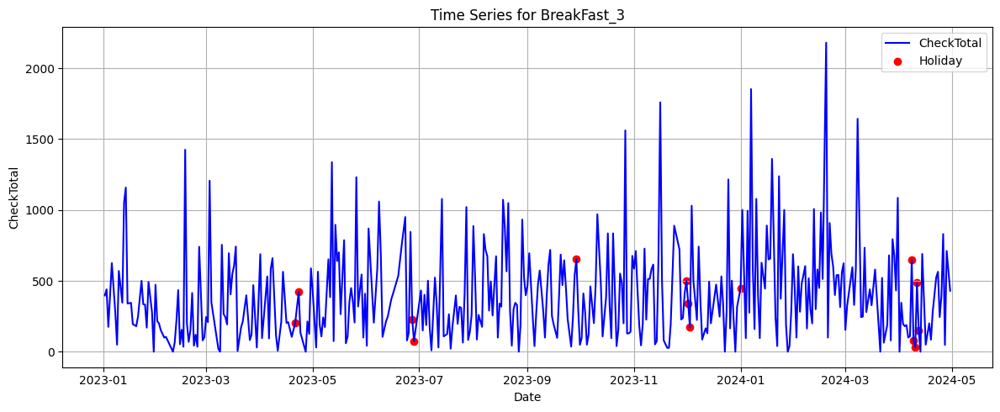

...

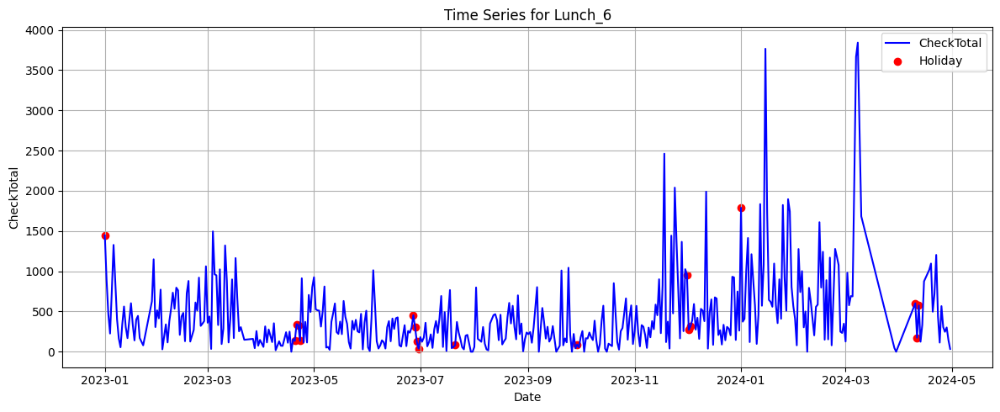

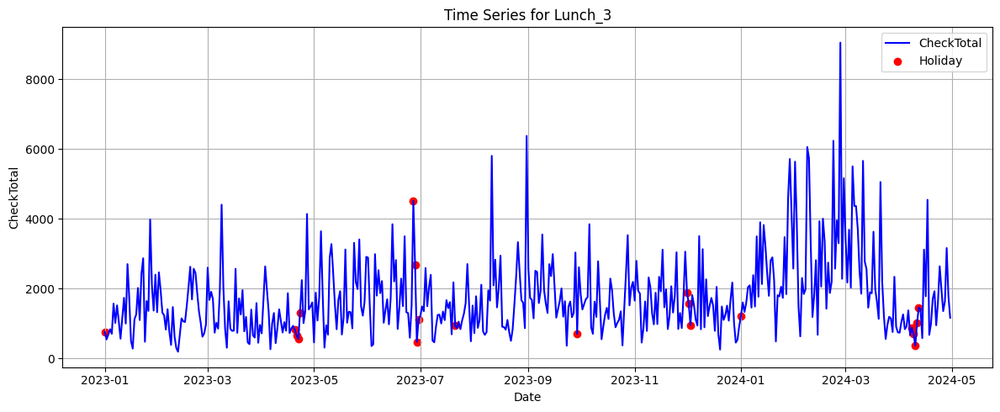

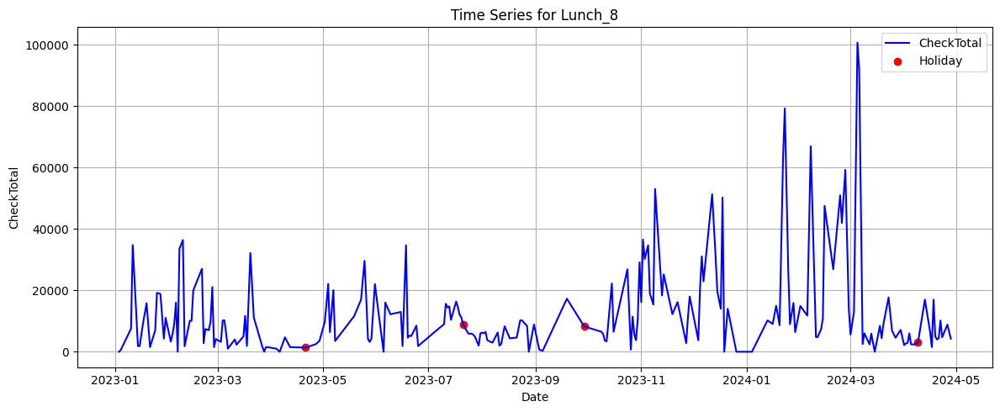

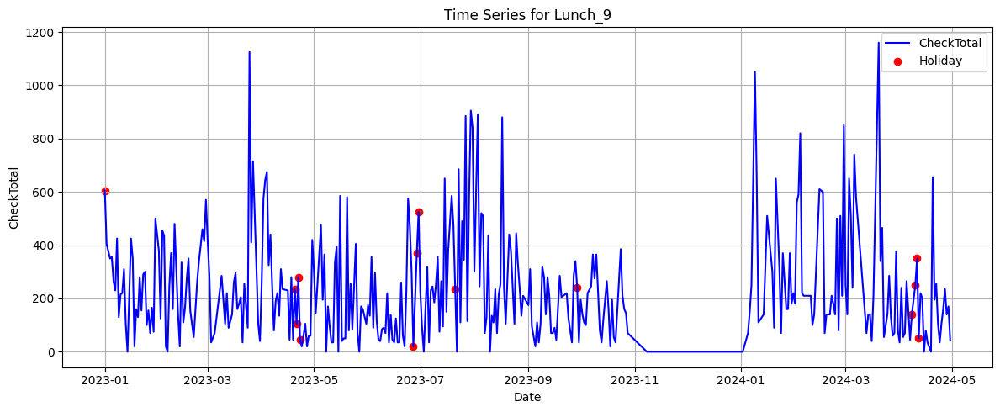

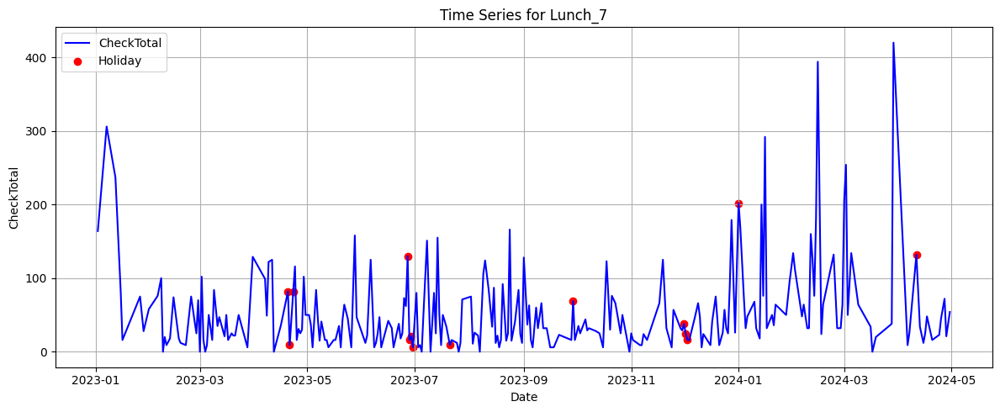

In [ ]:
for key, df_holiday in holiday_dict.items():
    meal, center_num = key.split("_")
    full_df = grouped[(grouped['MealPeriod'] == meal) &
                      (grouped['RevenueCenterName'] == f"RevenueCenter_{center_num}")]

    plt.figure(figsize=(12, 5))
    plt.plot(full_df['Date'], full_df['CheckTotal'], label='CheckTotal', color='blue')
    
    # Mark holidays
    holidays_df = df_holiday[['Date', 'CheckTotal']]
    plt.scatter(holidays_df['Date'], holidays_df['CheckTotal'], color='red', label='Holiday')

    plt.title(f"Time Series for {key}")
    plt.xlabel("Date")
    plt.ylabel("CheckTotal")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [150]:
grouped[(grouped['CheckTotal'] == 0) & (grouped['DayOfWeek'] == 6)].count()


Date                 22
MealPeriod           22
RevenueCenterName    22
CheckTotal           22
DayOfWeek            22
Month                22
Week                 22
dtype: int64

In [151]:
grouped[["RevenueCenterName", "MealPeriod"]]

,RevenueCenterName,MealPeriod
0,RevenueCenter_1,BreakFast
1,RevenueCenter_2,BreakFast
2,RevenueCenter_5,BreakFast
3,RevenueCenter_6,BreakFast
4,RevenueCenter_1,Dinner
...,...,...
9218,RevenueCenter_3,Lunch
9219,RevenueCenter_5,Lunch
9220,RevenueCenter_6,Lunch
9221,RevenueCenter_7,Lunch


In [152]:
grouped["RevenueCenterName"].unique()

array(['RevenueCenter_1', 'RevenueCenter_2', 'RevenueCenter_5',
       'RevenueCenter_6', 'RevenueCenter_3', 'RevenueCenter_8',
       'RevenueCenter_9', 'RevenueCenter_7'], dtype=object)

In [153]:
grouped["MealPeriod"].unique()

array(['BreakFast', 'Dinner', 'Lunch'], dtype=object)

######################################## Missing Dates ###################################################################

In [154]:
# 1. Create a full date range
full_range = pd.date_range(start='2023-01-01', end='2024-04-30', freq='D')

# 2. Get the existing dates from your DataFrame
existing_dates = grouped['Date'].unique()

# 3. Find missing dates
missing_dates = full_range.difference(existing_dates)

# 4. Output as DataFrame if needed
missing_df = pd.DataFrame({'Missing Date': missing_dates})

print(missing_df)

Empty DataFrame
Columns: [Missing Date]
Index: []


In [155]:
grouped

,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week
0,2023-01-01,BreakFast,RevenueCenter_1,1499.4,6,1,52
1,2023-01-01,BreakFast,RevenueCenter_2,35.0,6,1,52
2,2023-01-01,BreakFast,RevenueCenter_5,21807.0,6,1,52
3,2023-01-01,BreakFast,RevenueCenter_6,93.0,6,1,52
4,2023-01-01,Dinner,RevenueCenter_1,4374.5,6,1,52
...,...,...,...,...,...,...,...
9218,2024-04-30,Lunch,RevenueCenter_3,1167.0,1,4,18
9219,2024-04-30,Lunch,RevenueCenter_5,40.0,1,4,18
9220,2024-04-30,Lunch,RevenueCenter_6,35.0,1,4,18
9221,2024-04-30,Lunch,RevenueCenter_7,54.0,1,4,18


In [156]:
import itertools

# --- Step 2: Define the known unique values ---
revenue_centers = [
    'RevenueCenter_1', 'RevenueCenter_2', 'RevenueCenter_3',
    'RevenueCenter_4', 'RevenueCenter_5', 'RevenueCenter_6',
    'RevenueCenter_7', 'RevenueCenter_8', 'RevenueCenter_9'
]

meal_periods = ['BreakFast', 'Dinner', 'Lunch']

# --- Step 3: Create the full expected DataFrame ---
date_range = pd.date_range(start='2023-01-01', end='2024-04-30', freq='D')

# Create cartesian product of all combinations
full_combinations = pd.DataFrame(
    list(itertools.product(date_range, meal_periods, revenue_centers)),
    columns=['Date', 'MealPeriod', 'RevenueCenterName']
)

# --- Step 4: Find missing rows ---
# Merge actual data with full combinations
merged = full_combinations.merge(
    grouped[['Date', 'MealPeriod', 'RevenueCenterName']],
    on=['Date', 'MealPeriod', 'RevenueCenterName'],
    how='left',
    indicator=True
)

# Filter to get only missing rows
missing_rows = merged[merged['_merge'] == 'left_only'].drop('_merge', axis=1)

# --- Step 5: Output ---
print(missing_rows)
# Or to save: missing_rows.to_csv("missing_dates_by_group.csv", index=False)


            Date MealPeriod RevenueCenterName
2     2023-01-01  BreakFast   RevenueCenter_3
3     2023-01-01  BreakFast   RevenueCenter_4
6     2023-01-01  BreakFast   RevenueCenter_7
7     2023-01-01  BreakFast   RevenueCenter_8
8     2023-01-01  BreakFast   RevenueCenter_9
...          ...        ...               ...
13102 2024-04-30  BreakFast   RevenueCenter_8
13107 2024-04-30     Dinner   RevenueCenter_4
13110 2024-04-30     Dinner   RevenueCenter_7
13116 2024-04-30      Lunch   RevenueCenter_4
13120 2024-04-30      Lunch   RevenueCenter_8

[3899 rows x 3 columns]


In [157]:
missing_df_list = []
for center in grouped["RevenueCenterName"].unique():
    missing_df = missing_rows[missing_rows["RevenueCenterName"] == center]
    missing_df_list.append(missing_df)
    print(f"Missing data for {center}:")
    print(missing_df , '\n')

Missing data for RevenueCenter_1:
            Date MealPeriod RevenueCenterName
6228  2023-08-19      Lunch   RevenueCenter_1
7227  2023-09-25      Lunch   RevenueCenter_1
9909  2024-01-03  BreakFast   RevenueCenter_1
12438 2024-04-05      Lunch   RevenueCenter_1
12627 2024-04-12      Lunch   RevenueCenter_1 

Missing data for RevenueCenter_2:
            Date MealPeriod RevenueCenterName
1828  2023-03-09      Lunch   RevenueCenter_2
2188  2023-03-23  BreakFast   RevenueCenter_2
2206  2023-03-23      Lunch   RevenueCenter_2
2215  2023-03-24  BreakFast   RevenueCenter_2
2269  2023-03-26  BreakFast   RevenueCenter_2
...          ...        ...               ...
12484 2024-04-07     Dinner   RevenueCenter_2
12493 2024-04-07      Lunch   RevenueCenter_2
12511 2024-04-08     Dinner   RevenueCenter_2
12520 2024-04-08      Lunch   RevenueCenter_2
12574 2024-04-10      Lunch   RevenueCenter_2

[72 rows x 3 columns] 

Missing data for RevenueCenter_5:
            Date MealPeriod RevenueCenterNa

In [158]:
missing_df_list[0]

,Date,MealPeriod,RevenueCenterName
6228,2023-08-19,Lunch,RevenueCenter_1
7227,2023-09-25,Lunch,RevenueCenter_1
9909,2024-01-03,BreakFast,RevenueCenter_1
12438,2024-04-05,Lunch,RevenueCenter_1
12627,2024-04-12,Lunch,RevenueCenter_1


In [159]:
missing_df_list[1]

,Date,MealPeriod,RevenueCenterName
1828,2023-03-09,Lunch,RevenueCenter_2
2188,2023-03-23,BreakFast,RevenueCenter_2
2206,2023-03-23,Lunch,RevenueCenter_2
2215,2023-03-24,BreakFast,RevenueCenter_2
2269,2023-03-26,BreakFast,RevenueCenter_2
...,...,...,...
12484,2024-04-07,Dinner,RevenueCenter_2
12493,2024-04-07,Lunch,RevenueCenter_2
12511,2024-04-08,Dinner,RevenueCenter_2
12520,2024-04-08,Lunch,RevenueCenter_2


######################################## Missing Dates ###################################################################

In [160]:
grouped

,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week
0,2023-01-01,BreakFast,RevenueCenter_1,1499.4,6,1,52
1,2023-01-01,BreakFast,RevenueCenter_2,35.0,6,1,52
2,2023-01-01,BreakFast,RevenueCenter_5,21807.0,6,1,52
3,2023-01-01,BreakFast,RevenueCenter_6,93.0,6,1,52
4,2023-01-01,Dinner,RevenueCenter_1,4374.5,6,1,52
...,...,...,...,...,...,...,...
9218,2024-04-30,Lunch,RevenueCenter_3,1167.0,1,4,18
9219,2024-04-30,Lunch,RevenueCenter_5,40.0,1,4,18
9220,2024-04-30,Lunch,RevenueCenter_6,35.0,1,4,18
9221,2024-04-30,Lunch,RevenueCenter_7,54.0,1,4,18


In [161]:
seperate_df_list = []
for center in grouped["RevenueCenterName"].unique():
    for meal in grouped["MealPeriod"].unique():
        df_center_meal = grouped[(grouped["RevenueCenterName"] == center) & (grouped["MealPeriod"] == meal)]
        if not df_center_meal.empty:
            seperate_df_list.append(df_center_meal.reset_index())
            print(df_center_meal)

           Date MealPeriod RevenueCenterName  CheckTotal  DayOfWeek  Month  \
0    2023-01-01  BreakFast   RevenueCenter_1      1499.4          6      1   
16   2023-01-02  BreakFast   RevenueCenter_1       771.0          0      1   
33   2023-01-03  BreakFast   RevenueCenter_1      1302.4          1      1   
51   2023-01-04  BreakFast   RevenueCenter_1      1737.0          2      1   
69   2023-01-05  BreakFast   RevenueCenter_1       653.0          3      1   
...         ...        ...               ...         ...        ...    ...   
9120 2024-04-26  BreakFast   RevenueCenter_1      1005.0          4      4   
9142 2024-04-27  BreakFast   RevenueCenter_1       736.0          5      4   
9163 2024-04-28  BreakFast   RevenueCenter_1       863.0          6      4   
9184 2024-04-29  BreakFast   RevenueCenter_1      1064.7          0      4   
9202 2024-04-30  BreakFast   RevenueCenter_1       566.0          1      4   

      Week  
0       52  
16       1  
33       1  
51       1 

In [162]:
seperate_df_list[0]

,index,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week
0,0,2023-01-01,BreakFast,RevenueCenter_1,1499.4,6,1,52
1,16,2023-01-02,BreakFast,RevenueCenter_1,771.0,0,1,1
2,33,2023-01-03,BreakFast,RevenueCenter_1,1302.4,1,1,1
3,51,2023-01-04,BreakFast,RevenueCenter_1,1737.0,2,1,1
4,69,2023-01-05,BreakFast,RevenueCenter_1,653.0,3,1,1
...,...,...,...,...,...,...,...,...
480,9120,2024-04-26,BreakFast,RevenueCenter_1,1005.0,4,4,17
481,9142,2024-04-27,BreakFast,RevenueCenter_1,736.0,5,4,17
482,9163,2024-04-28,BreakFast,RevenueCenter_1,863.0,6,4,17
483,9184,2024-04-29,BreakFast,RevenueCenter_1,1064.7,0,4,18


In [163]:
seperate_df_list[5]

,index,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week
0,11,2023-01-01,Lunch,RevenueCenter_2,30.0,6,1,52
1,27,2023-01-02,Lunch,RevenueCenter_2,136.0,0,1,1
2,46,2023-01-03,Lunch,RevenueCenter_2,594.0,1,1,1
3,63,2023-01-04,Lunch,RevenueCenter_2,195.0,2,1,1
4,80,2023-01-05,Lunch,RevenueCenter_2,136.0,3,1,1
...,...,...,...,...,...,...,...,...
460,9136,2024-04-26,Lunch,RevenueCenter_2,351.0,4,4,17
461,9157,2024-04-27,Lunch,RevenueCenter_2,200.0,5,4,17
462,9177,2024-04-28,Lunch,RevenueCenter_2,459.5,6,4,17
463,9197,2024-04-29,Lunch,RevenueCenter_2,706.0,0,4,18


In [164]:
seperate_df_list[0]

,index,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week
0,0,2023-01-01,BreakFast,RevenueCenter_1,1499.4,6,1,52
1,16,2023-01-02,BreakFast,RevenueCenter_1,771.0,0,1,1
2,33,2023-01-03,BreakFast,RevenueCenter_1,1302.4,1,1,1
3,51,2023-01-04,BreakFast,RevenueCenter_1,1737.0,2,1,1
4,69,2023-01-05,BreakFast,RevenueCenter_1,653.0,3,1,1
...,...,...,...,...,...,...,...,...
480,9120,2024-04-26,BreakFast,RevenueCenter_1,1005.0,4,4,17
481,9142,2024-04-27,BreakFast,RevenueCenter_1,736.0,5,4,17
482,9163,2024-04-28,BreakFast,RevenueCenter_1,863.0,6,4,17
483,9184,2024-04-29,BreakFast,RevenueCenter_1,1064.7,0,4,18


In [165]:
'''
import matplotlib.pyplot as plt

for df in seperate_df_list:
    rev_center = df['RevenueCenterName'].iloc[0]
    meal_period = df['MealPeriod'].iloc[0]
    plt.figure(figsize=(12, 6))
    plt.plot(df['Date'], df['CheckTotal'])
    plt.title('Time Series Plot - {} -{}'.format(rev_center, meal_period))
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.grid(True)
    plt.show()
'''

"\nimport matplotlib.pyplot as plt\n\nfor df in seperate_df_list:\n    rev_center = df['RevenueCenterName'].iloc[0]\n    meal_period = df['MealPeriod'].iloc[0]\n    plt.figure(figsize=(12, 6))\n    plt.plot(df['Date'], df['CheckTotal'])\n    plt.title('Time Series Plot - {} -{}'.format(rev_center, meal_period))\n    plt.xlabel('Date')\n    plt.ylabel('Value')\n    plt.grid(True)\n    plt.show()\n"

In [166]:
# Analysing if Check total is zero for any day of the week - for each revenue center and each meal period combination
# This will help identify if there are any days where no revenue was recorded or holidays for a specific meal period of specific center
for d in seperate_df_list:
    print(d["RevenueCenterName"].unique() , " - ", d["MealPeriod"].unique())
    print(d[d["CheckTotal"] == 0 ]["DayOfWeek"].unique())
    print()

['RevenueCenter_1']  -  ['BreakFast']
[0]

['RevenueCenter_1']  -  ['Dinner']
[]

['RevenueCenter_1']  -  ['Lunch']
[3 5]

['RevenueCenter_2']  -  ['BreakFast']
[5 3 4 0 2 1]

['RevenueCenter_2']  -  ['Dinner']
[2 0 1 5]

['RevenueCenter_2']  -  ['Lunch']
[5 1 0 3 6]

['RevenueCenter_5']  -  ['BreakFast']
[]

['RevenueCenter_5']  -  ['Dinner']
[]

['RevenueCenter_5']  -  ['Lunch']
[5 0 3 1]

['RevenueCenter_6']  -  ['BreakFast']
[3 6 4 1 0 2 5]

['RevenueCenter_6']  -  ['Dinner']
[2 6 5 1]

['RevenueCenter_6']  -  ['Lunch']
[1 6 0 3 2 5]

['RevenueCenter_3']  -  ['BreakFast']
[0 4 3 6 5]

['RevenueCenter_3']  -  ['Dinner']
[]

['RevenueCenter_3']  -  ['Lunch']
[]

['RevenueCenter_8']  -  ['BreakFast']
[3 4 0]

['RevenueCenter_8']  -  ['Dinner']
[2 0 3 4 6 1]

['RevenueCenter_8']  -  ['Lunch']
[1 0 3 4]

['RevenueCenter_9']  -  ['BreakFast']
[6 0 4 1 5 2 3]

['RevenueCenter_9']  -  ['Dinner']
[5 3 0 1 4 6 2]

['RevenueCenter_9']  -  ['Lunch']
[5 0 3 2 6 1 4]

['RevenueCenter_7']  -  ['B

In [167]:
df00 = seperate_df_list[0].copy()

In [168]:
df00

,index,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week
0,0,2023-01-01,BreakFast,RevenueCenter_1,1499.4,6,1,52
1,16,2023-01-02,BreakFast,RevenueCenter_1,771.0,0,1,1
2,33,2023-01-03,BreakFast,RevenueCenter_1,1302.4,1,1,1
3,51,2023-01-04,BreakFast,RevenueCenter_1,1737.0,2,1,1
4,69,2023-01-05,BreakFast,RevenueCenter_1,653.0,3,1,1
...,...,...,...,...,...,...,...,...
480,9120,2024-04-26,BreakFast,RevenueCenter_1,1005.0,4,4,17
481,9142,2024-04-27,BreakFast,RevenueCenter_1,736.0,5,4,17
482,9163,2024-04-28,BreakFast,RevenueCenter_1,863.0,6,4,17
483,9184,2024-04-29,BreakFast,RevenueCenter_1,1064.7,0,4,18


In [169]:
df00[(df00['CheckTotal'] == 0) & (df00['DayOfWeek'] == 0)]

,index,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week
92,1750,2023-04-03,BreakFast,RevenueCenter_1,0.0,0,4,14
455,8650,2024-04-01,BreakFast,RevenueCenter_1,0.0,0,4,14


In [170]:
seperate_df_list[15]

,index,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week
0,452,2023-01-26,BreakFast,RevenueCenter_8,0.0,3,1,4
1,580,2023-02-02,BreakFast,RevenueCenter_8,19610.0,3,2,5
2,677,2023-02-07,BreakFast,RevenueCenter_8,10945.0,1,2,6
3,959,2023-02-21,BreakFast,RevenueCenter_8,6845.0,1,2,8
4,1001,2023-02-23,BreakFast,RevenueCenter_8,6845.0,3,2,8
5,1021,2023-02-24,BreakFast,RevenueCenter_8,0.0,4,2,8
6,1493,2023-03-19,BreakFast,RevenueCenter_8,7100.0,6,3,11
7,1534,2023-03-21,BreakFast,RevenueCenter_8,2250.0,1,3,12
8,1650,2023-03-28,BreakFast,RevenueCenter_8,1500.0,1,3,13
9,1804,2023-04-06,BreakFast,RevenueCenter_8,6000.0,3,4,14


In [171]:
cleaned_df_list = []
for d in seperate_df_list:
    print(d["RevenueCenterName"].unique() , " - ", d["MealPeriod"].unique())
    # Calculate Q1 and Q3
    Q1 = d["CheckTotal"].quantile(0.25)
    Q3 = d["CheckTotal"].quantile(0.75)
    
    # Compute IQR
    IQR = Q3 - Q1

    # Define lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    if lower_bound < 0:
        lower_bound = 0

    print(f"Lower bound: {lower_bound}, Upper bound: {upper_bound}" , "\n")

    # Filter the DataFrame to remove outliers
    cleaned_df_list.append(d[(d["CheckTotal"] > lower_bound) & (d["CheckTotal"] <= upper_bound)])

['RevenueCenter_1']  -  ['BreakFast']
Lower bound: 0, Upper bound: 2388.5 

['RevenueCenter_1']  -  ['Dinner']
Lower bound: 0, Upper bound: 5801.875 

['RevenueCenter_1']  -  ['Lunch']
Lower bound: 0, Upper bound: 1830.8125 

['RevenueCenter_2']  -  ['BreakFast']
Lower bound: 0, Upper bound: 1071.6875 

['RevenueCenter_2']  -  ['Dinner']
Lower bound: 0, Upper bound: 1335.0 

['RevenueCenter_2']  -  ['Lunch']
Lower bound: 0, Upper bound: 1159.75 

['RevenueCenter_5']  -  ['BreakFast']
Lower bound: 8377.75, Upper bound: 23655.75 

['RevenueCenter_5']  -  ['Dinner']
Lower bound: 0, Upper bound: 21506.5375 

['RevenueCenter_5']  -  ['Lunch']
Lower bound: 0, Upper bound: 4240.0 

['RevenueCenter_6']  -  ['BreakFast']
Lower bound: 0, Upper bound: 704.0 

['RevenueCenter_6']  -  ['Dinner']
Lower bound: 0, Upper bound: 1532.0 

['RevenueCenter_6']  -  ['Lunch']
Lower bound: 0, Upper bound: 1250.3125 

['RevenueCenter_3']  -  ['BreakFast']
Lower bound: 0, Upper bound: 1186.59375 

['RevenueCent

In [172]:
cleaned_df_list[15]

,index,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week
2,677,2023-02-07,BreakFast,RevenueCenter_8,10945.0,1,2,6
3,959,2023-02-21,BreakFast,RevenueCenter_8,6845.0,1,2,8
4,1001,2023-02-23,BreakFast,RevenueCenter_8,6845.0,3,2,8
6,1493,2023-03-19,BreakFast,RevenueCenter_8,7100.0,6,3,11
7,1534,2023-03-21,BreakFast,RevenueCenter_8,2250.0,1,3,12
8,1650,2023-03-28,BreakFast,RevenueCenter_8,1500.0,1,3,13
9,1804,2023-04-06,BreakFast,RevenueCenter_8,6000.0,3,4,14
10,2878,2023-06-01,BreakFast,RevenueCenter_8,5300.0,3,6,22
11,2899,2023-06-02,BreakFast,RevenueCenter_8,14620.0,4,6,22
12,3286,2023-06-22,BreakFast,RevenueCenter_8,5600.0,3,6,25


In [173]:
cleaned_df_list[7]

,index,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week
0,7,2023-01-01,Dinner,RevenueCenter_5,4395.0,6,1,52
1,24,2023-01-02,Dinner,RevenueCenter_5,2958.0,0,1,1
2,42,2023-01-03,Dinner,RevenueCenter_5,3064.5,1,1,1
3,60,2023-01-04,Dinner,RevenueCenter_5,2584.5,2,1,1
4,77,2023-01-05,Dinner,RevenueCenter_5,5348.0,3,1,1
...,...,...,...,...,...,...,...,...
481,9130,2024-04-26,Dinner,RevenueCenter_5,10863.5,4,4,17
482,9152,2024-04-27,Dinner,RevenueCenter_5,2413.0,5,4,17
483,9172,2024-04-28,Dinner,RevenueCenter_5,4230.0,6,4,17
484,9192,2024-04-29,Dinner,RevenueCenter_5,3731.7,0,4,18


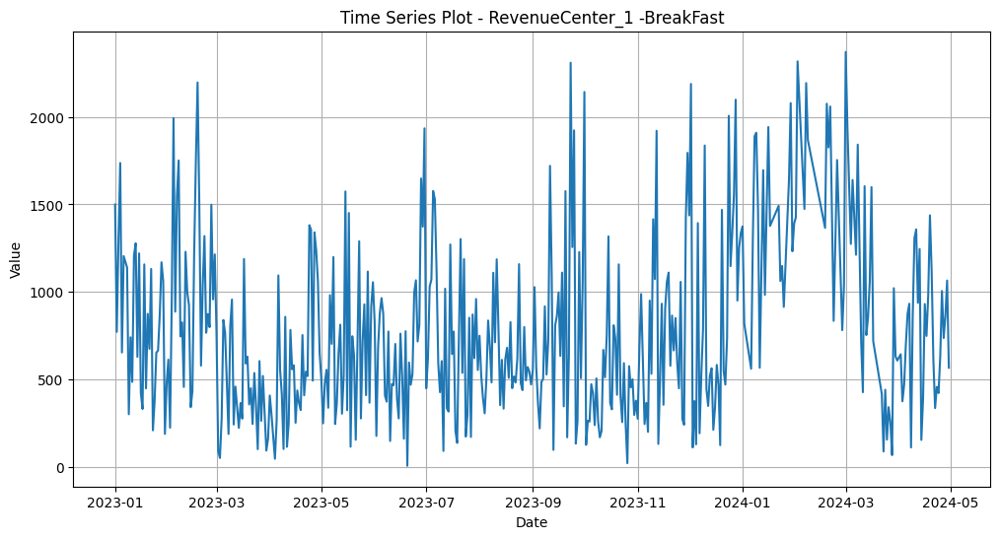

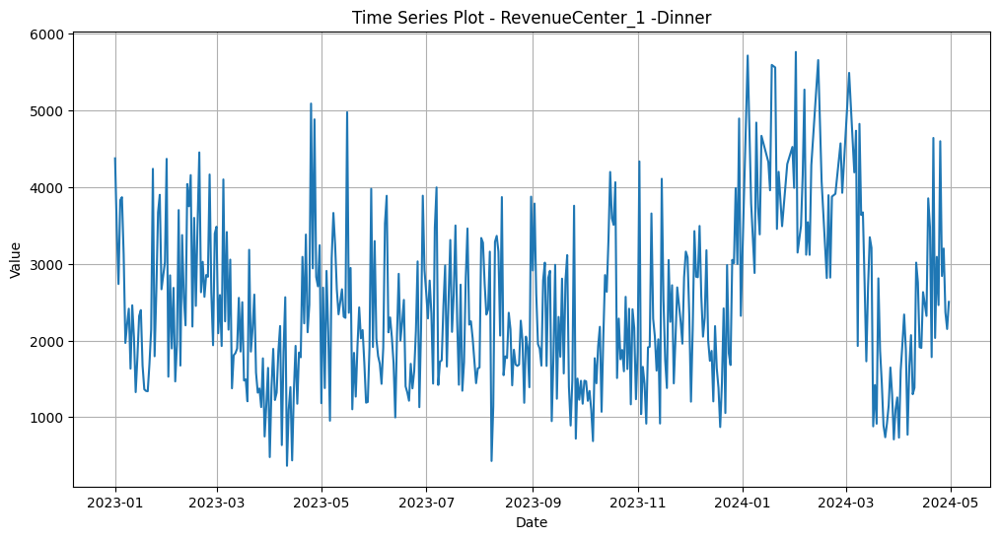

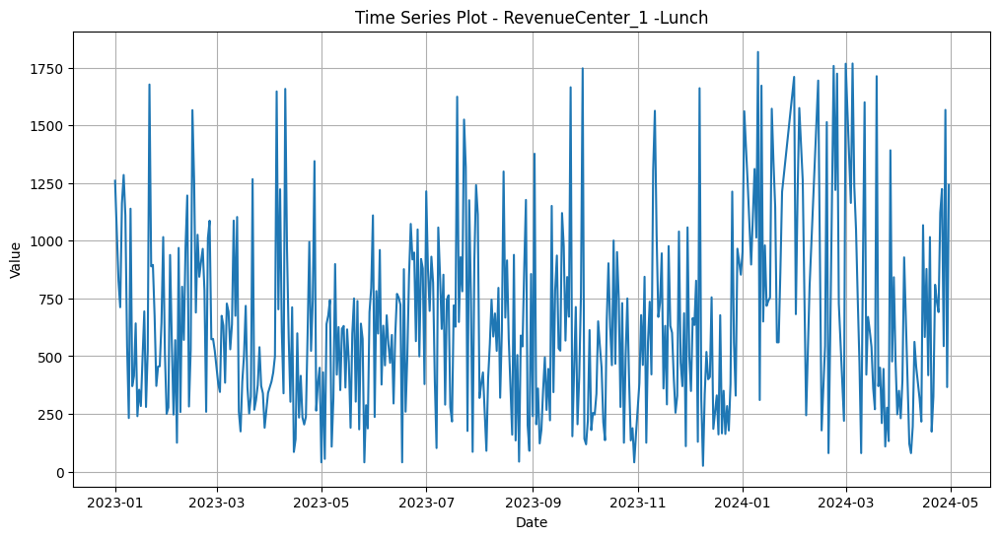

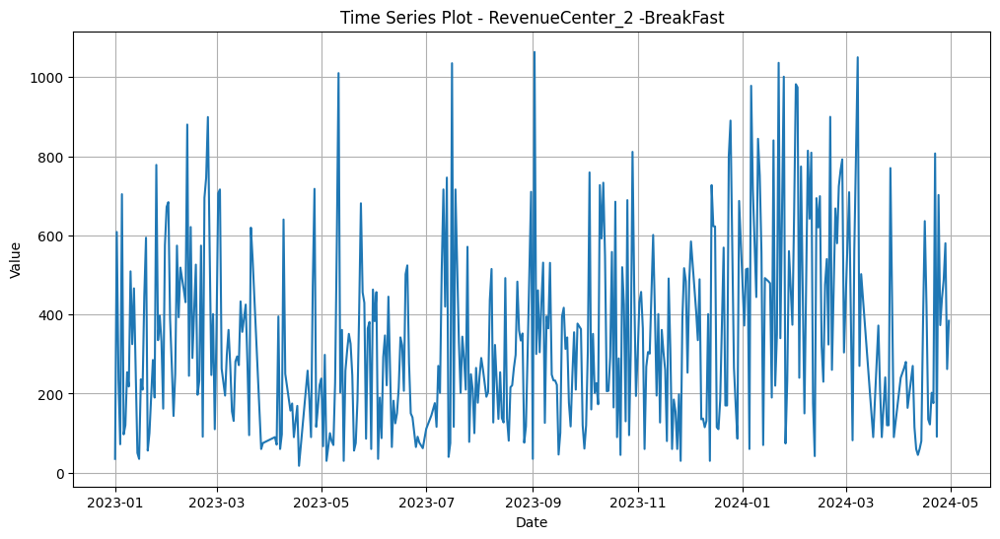

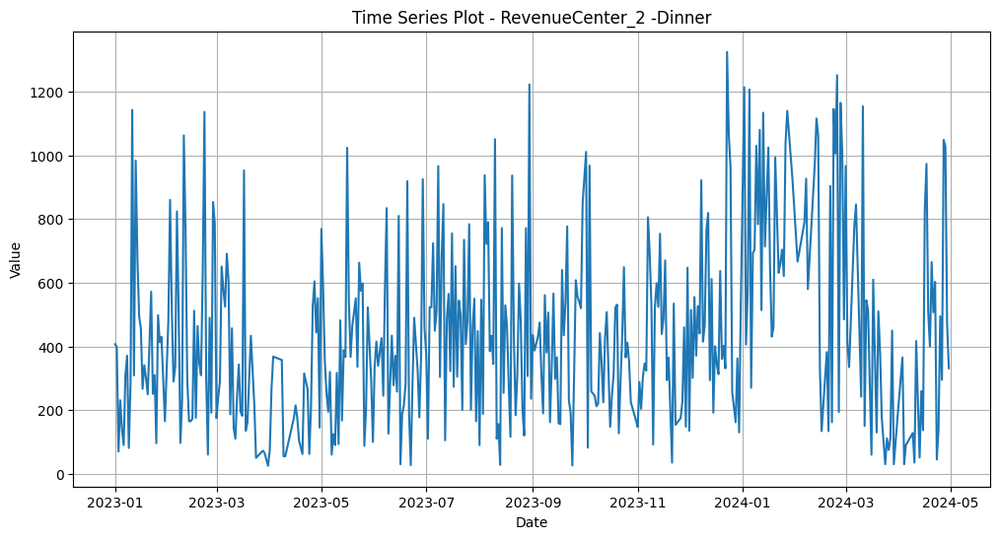

...

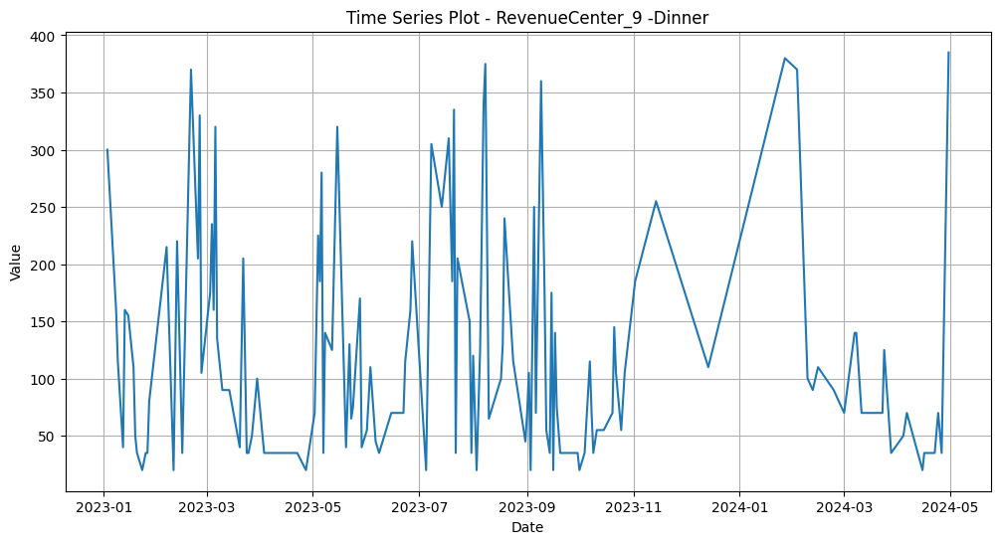

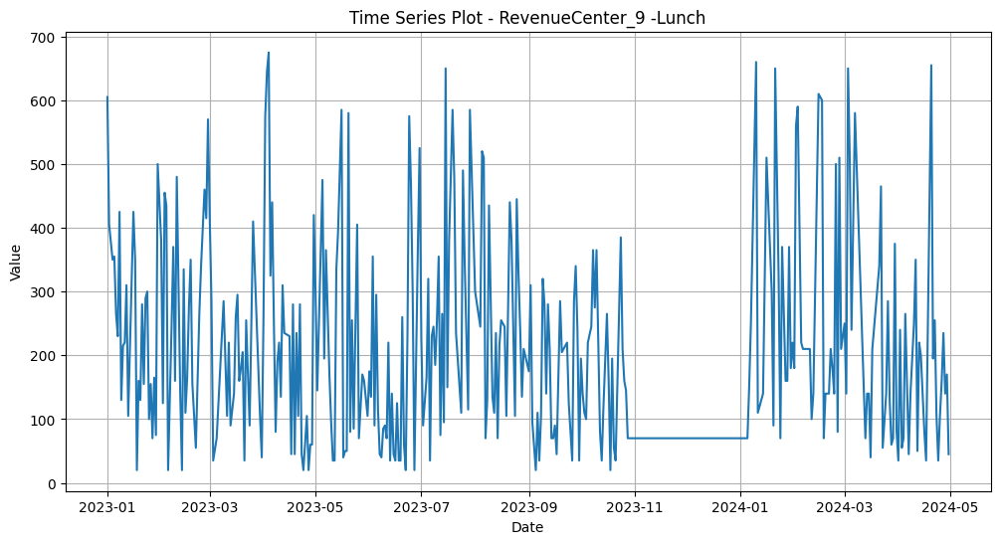

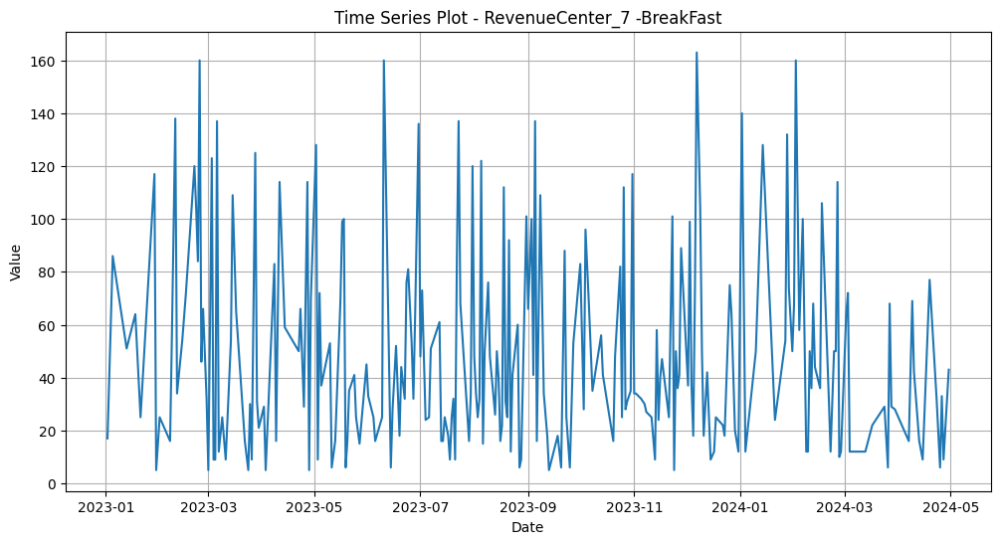

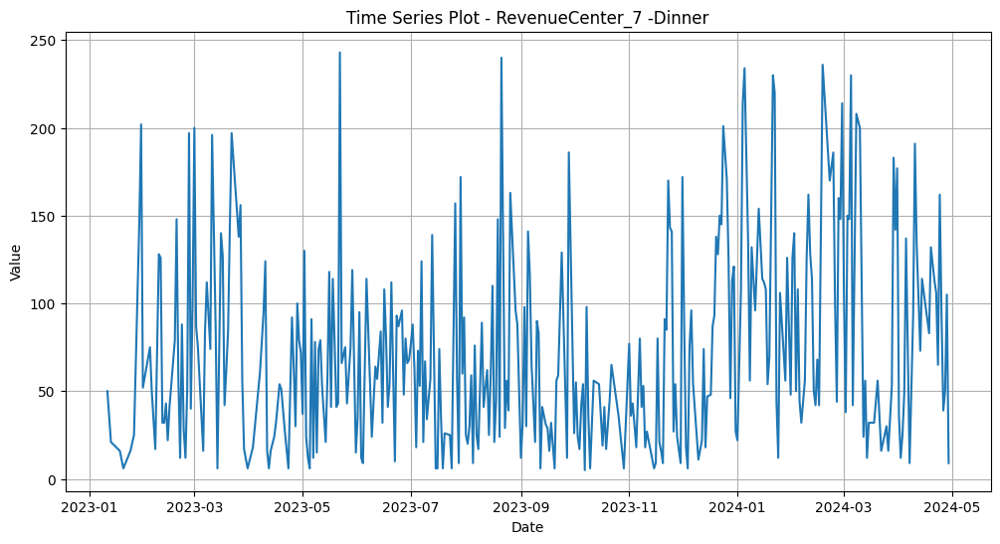

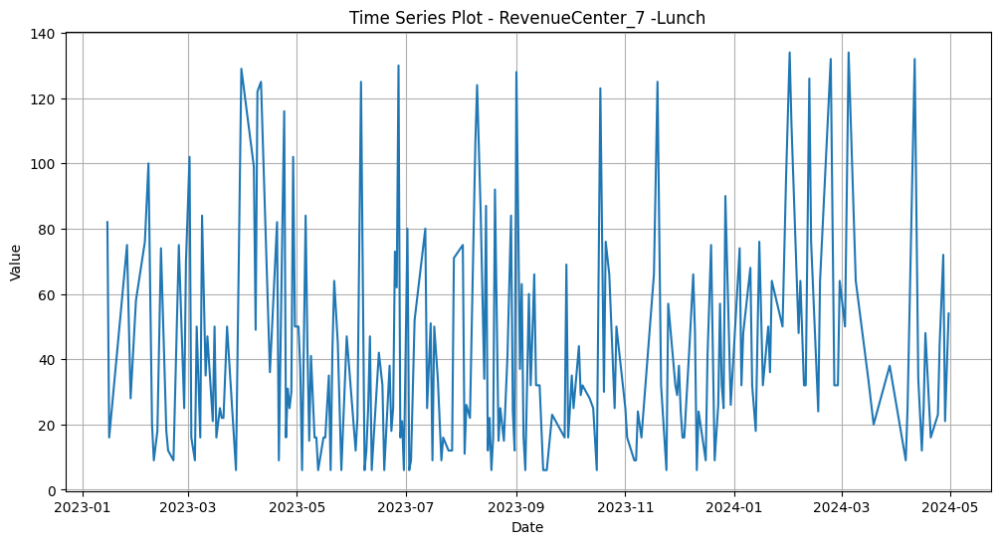

In [174]:
for df in cleaned_df_list:
    rev_center = df['RevenueCenterName'].iloc[0]
    meal_period = df['MealPeriod'].iloc[0]
    plt.figure(figsize=(12, 6))
    plt.plot(df['Date'], df['CheckTotal'])
    plt.title('Time Series Plot - {} -{}'.format(rev_center, meal_period))
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.grid(True)
    plt.show()

################################################ Using Facebook Prophet Model #############################################################3

In [175]:

def forecast_prophet(data, period=90):
    model = Prophet()
    model.fit(data)
    future = model.make_future_dataframe(periods=period)
    forecast = model.predict(future)
    return model, forecast
    

08:55:07 - cmdstanpy - INFO - Chain [1] start processing
08:55:07 - cmdstanpy - INFO - Chain [1] done processing


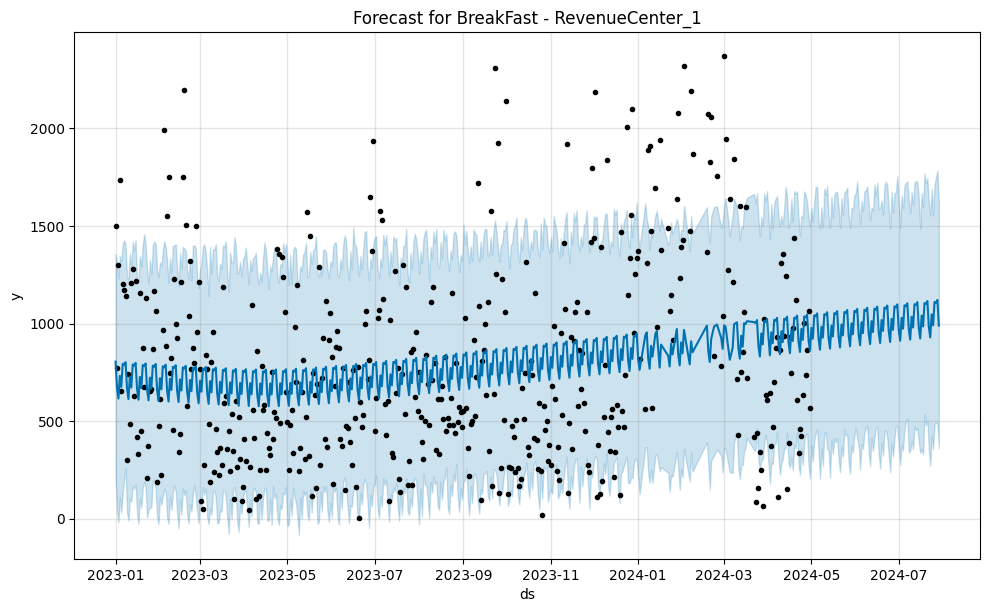

08:55:08 - cmdstanpy - INFO - Chain [1] start processing
08:55:08 - cmdstanpy - INFO - Chain [1] done processing


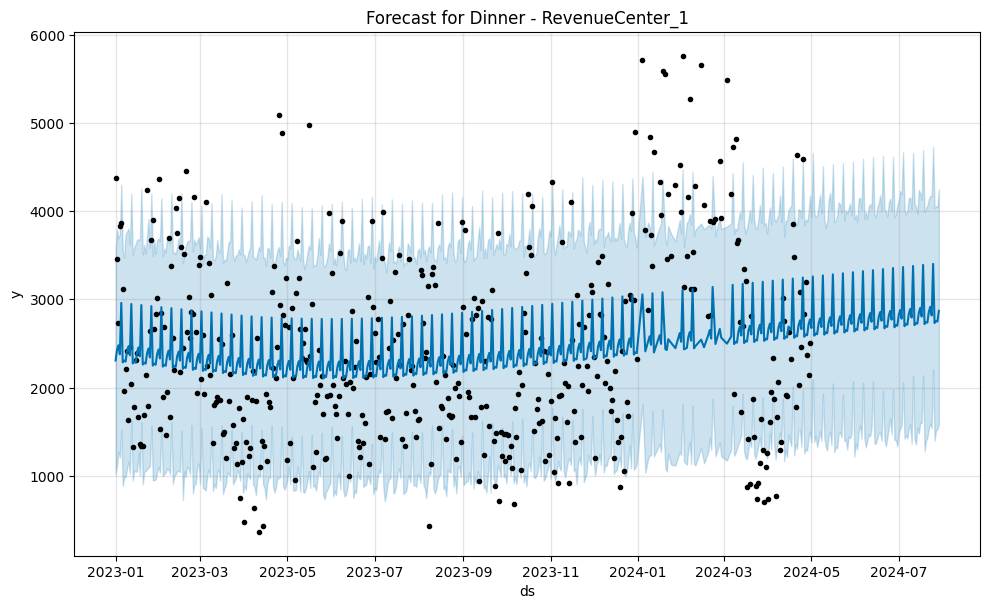

08:55:08 - cmdstanpy - INFO - Chain [1] start processing
08:55:09 - cmdstanpy - INFO - Chain [1] done processing


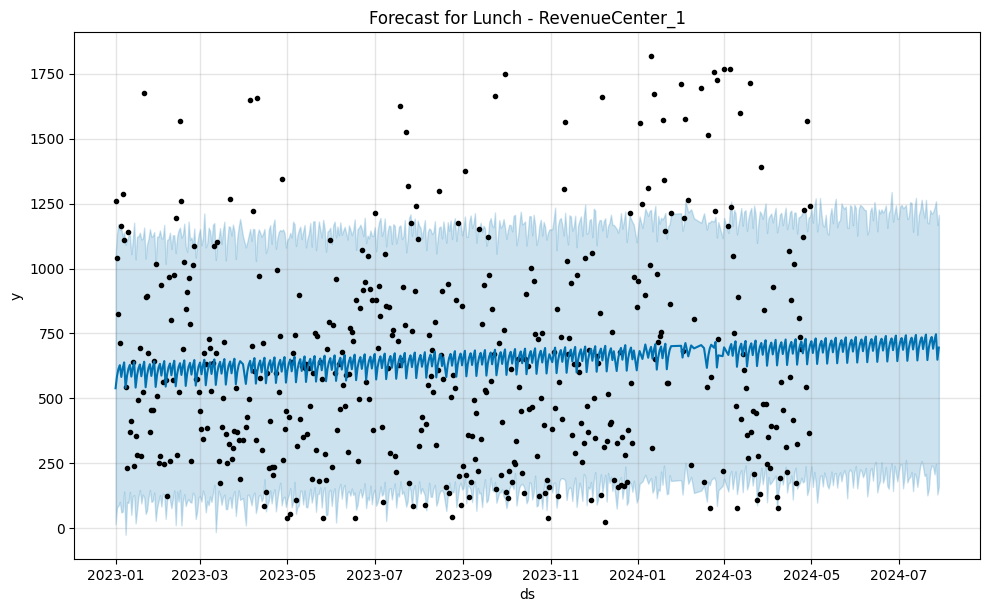

08:55:09 - cmdstanpy - INFO - Chain [1] start processing
08:55:09 - cmdstanpy - INFO - Chain [1] done processing


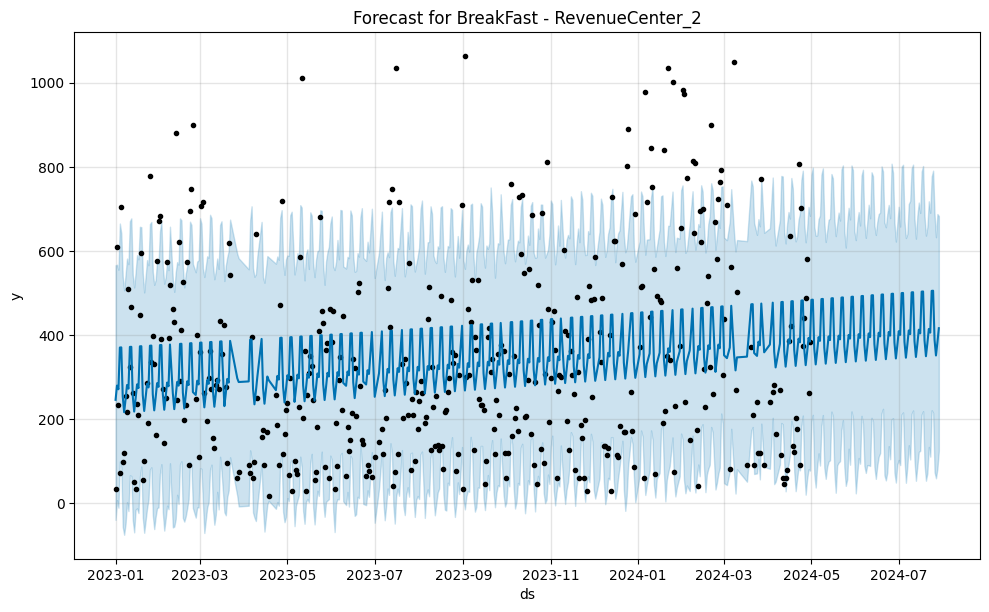

08:55:09 - cmdstanpy - INFO - Chain [1] start processing
08:55:09 - cmdstanpy - INFO - Chain [1] done processing


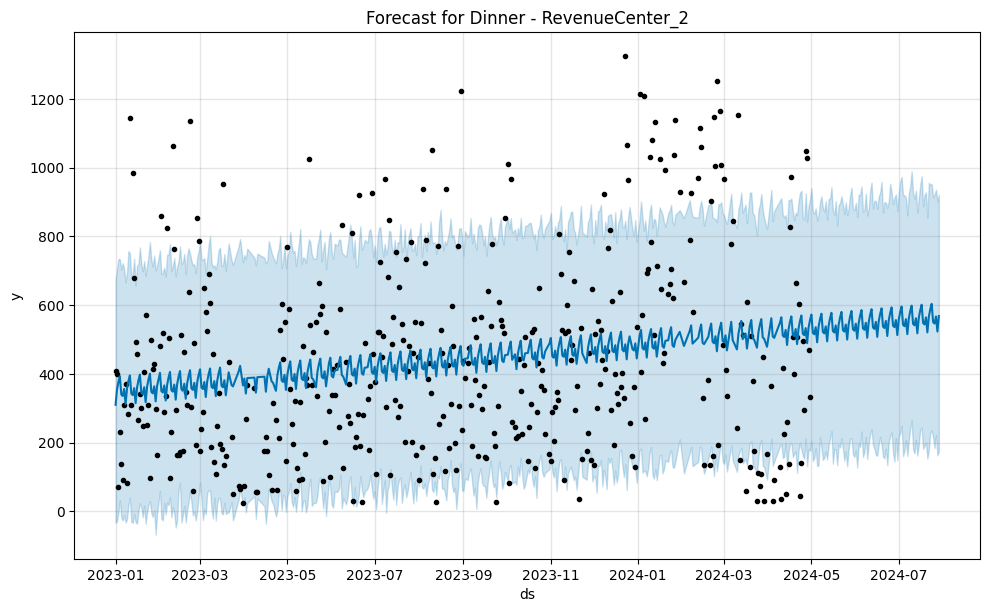

08:55:10 - cmdstanpy - INFO - Chain [1] start processing
08:55:10 - cmdstanpy - INFO - Chain [1] done processing


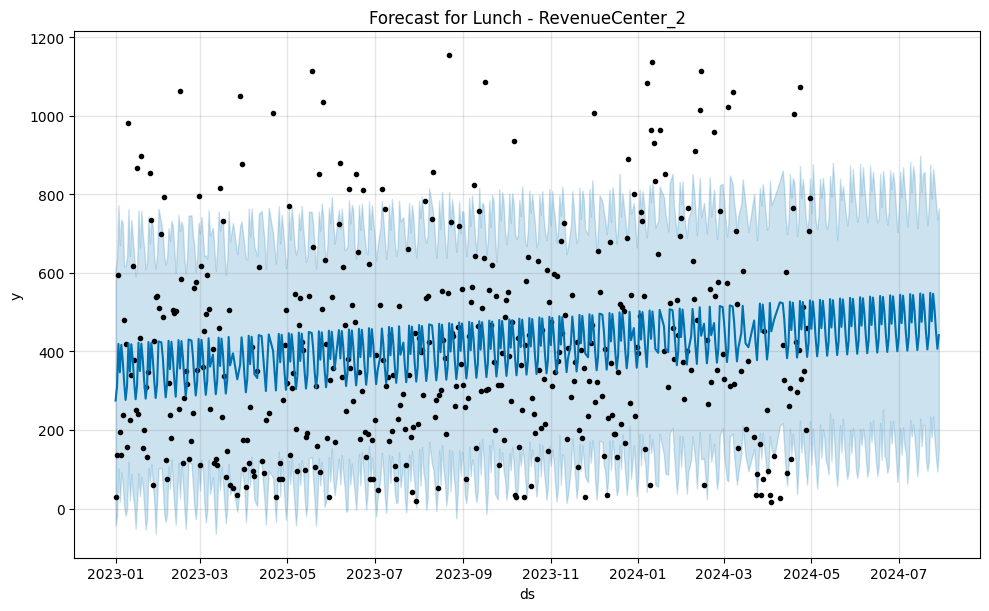

08:55:10 - cmdstanpy - INFO - Chain [1] start processing
08:55:10 - cmdstanpy - INFO - Chain [1] done processing


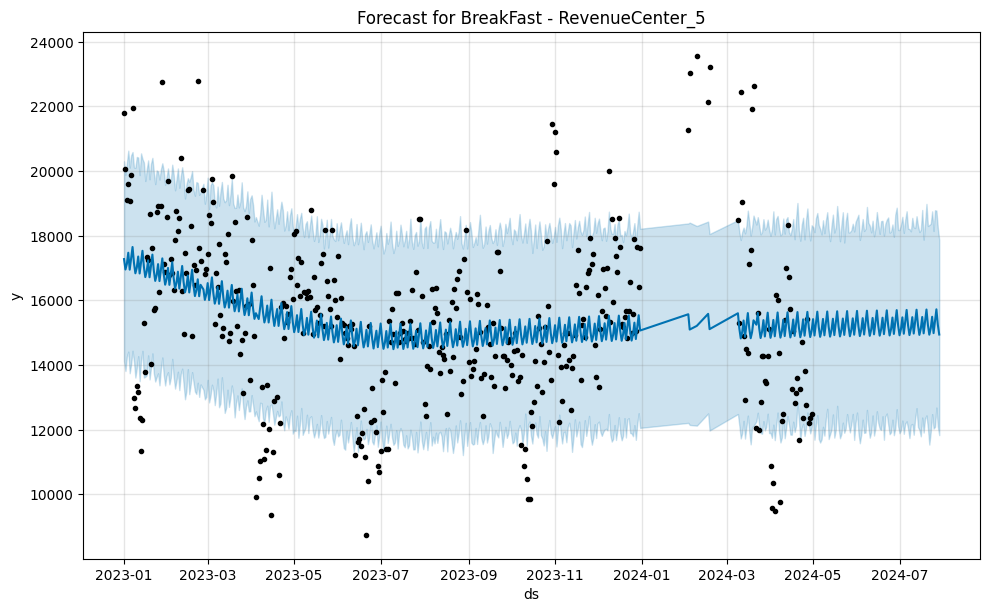

08:55:11 - cmdstanpy - INFO - Chain [1] start processing
08:55:11 - cmdstanpy - INFO - Chain [1] done processing


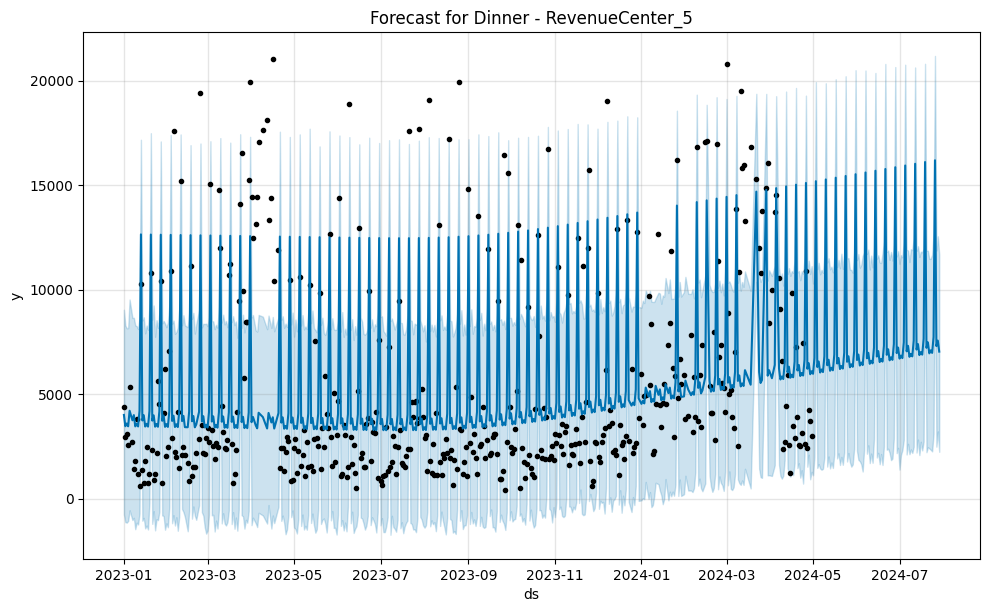

08:55:11 - cmdstanpy - INFO - Chain [1] start processing
08:55:11 - cmdstanpy - INFO - Chain [1] done processing


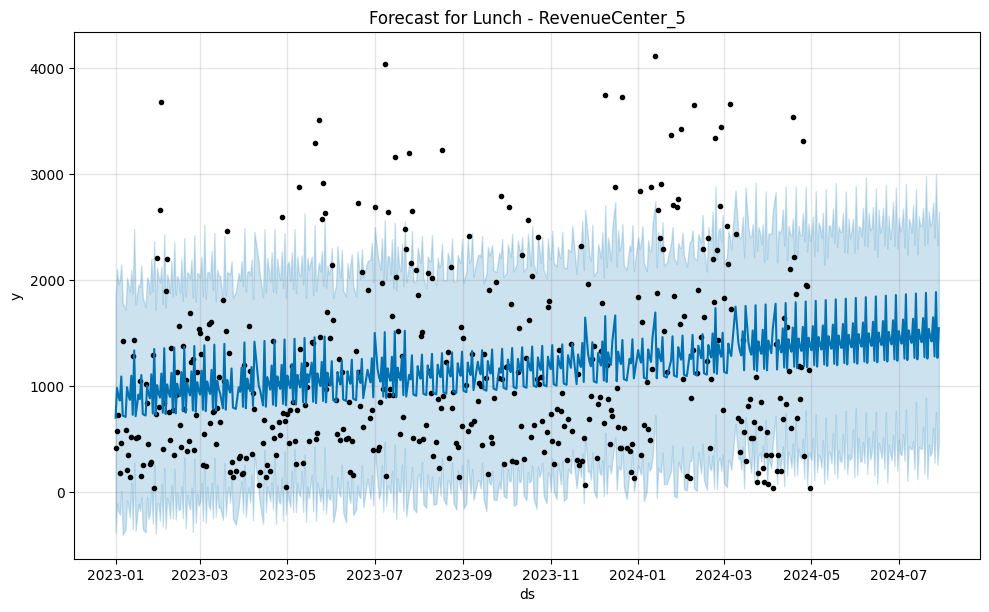

08:55:11 - cmdstanpy - INFO - Chain [1] start processing
08:55:11 - cmdstanpy - INFO - Chain [1] done processing


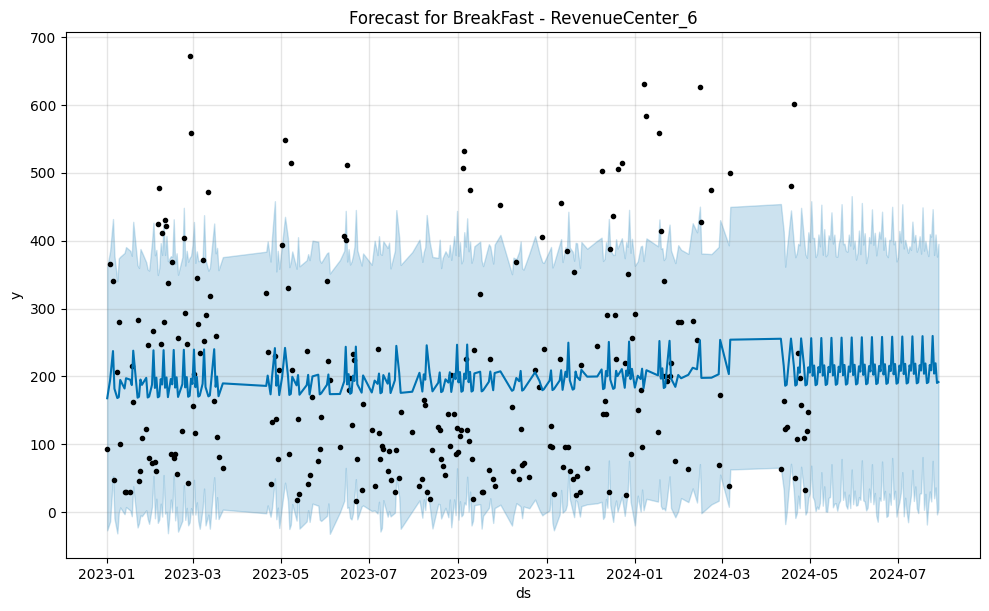

08:55:12 - cmdstanpy - INFO - Chain [1] start processing
08:55:12 - cmdstanpy - INFO - Chain [1] done processing


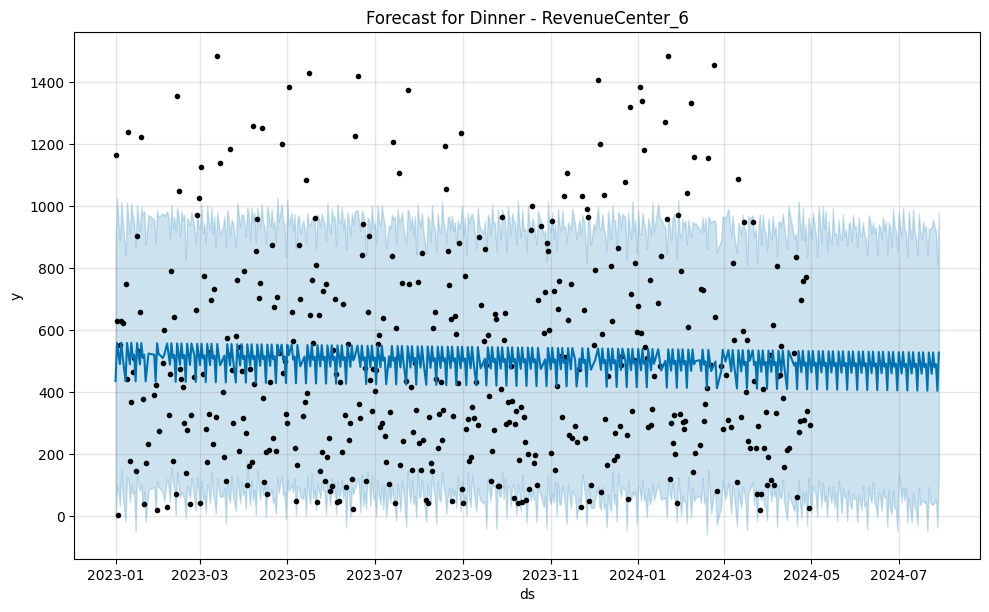

08:55:12 - cmdstanpy - INFO - Chain [1] start processing
08:55:12 - cmdstanpy - INFO - Chain [1] done processing


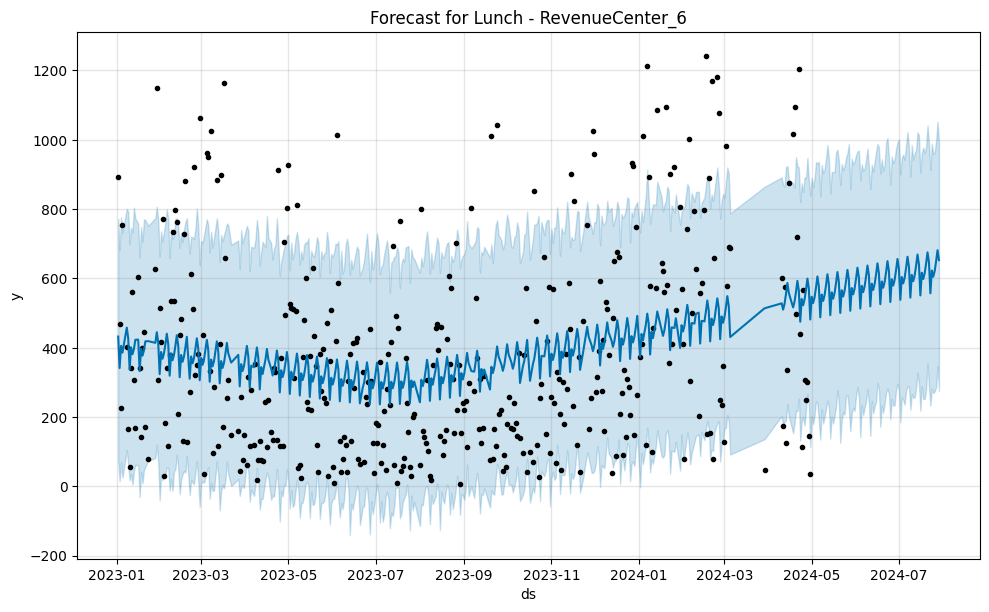

08:55:13 - cmdstanpy - INFO - Chain [1] start processing
08:55:13 - cmdstanpy - INFO - Chain [1] done processing


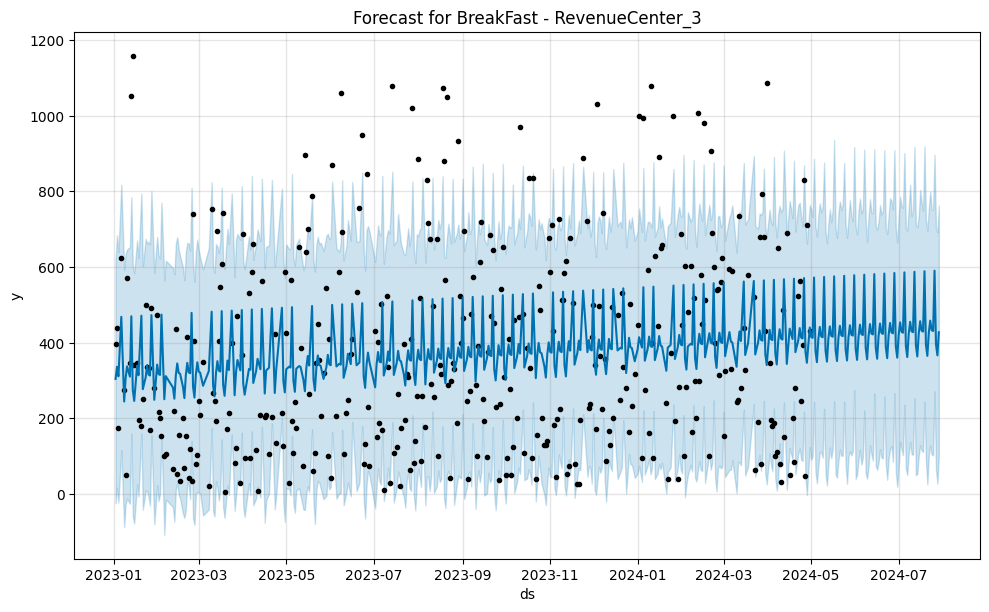

08:55:13 - cmdstanpy - INFO - Chain [1] start processing
08:55:13 - cmdstanpy - INFO - Chain [1] done processing


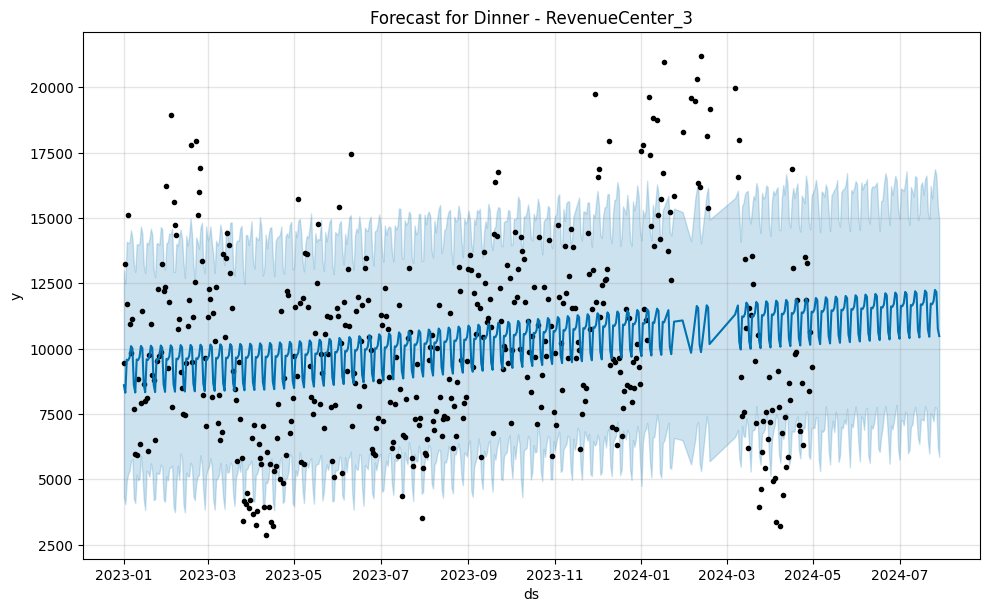

08:55:14 - cmdstanpy - INFO - Chain [1] start processing
08:55:14 - cmdstanpy - INFO - Chain [1] done processing


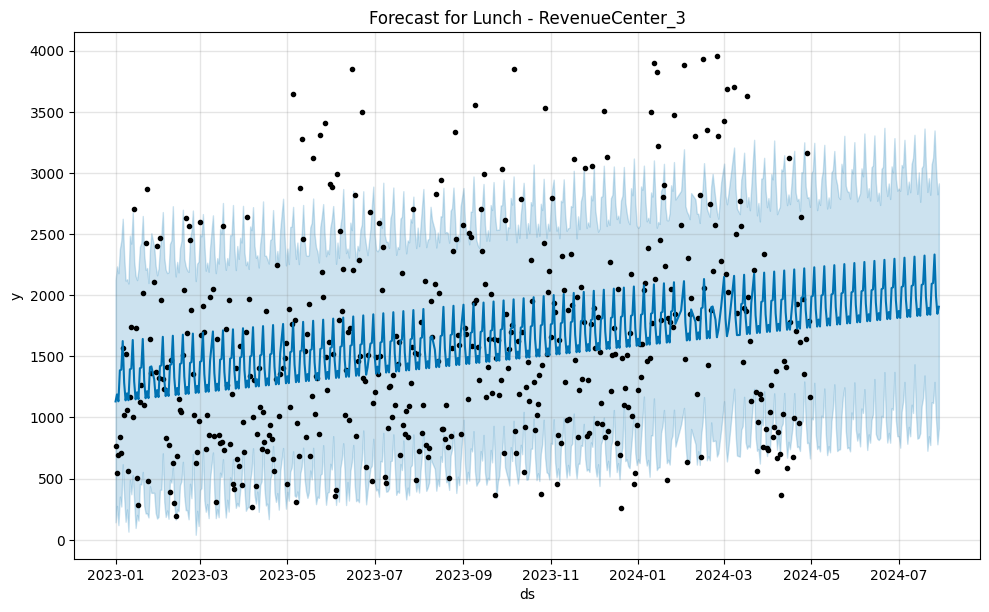

08:55:14 - cmdstanpy - INFO - Chain [1] start processing
08:55:14 - cmdstanpy - INFO - Chain [1] done processing


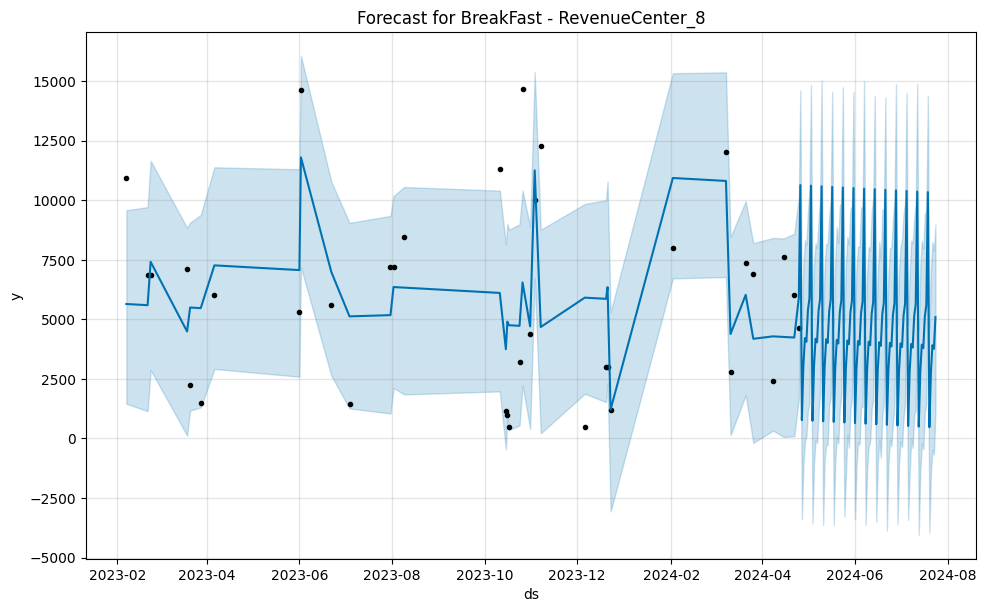

08:55:15 - cmdstanpy - INFO - Chain [1] start processing
08:55:15 - cmdstanpy - INFO - Chain [1] done processing


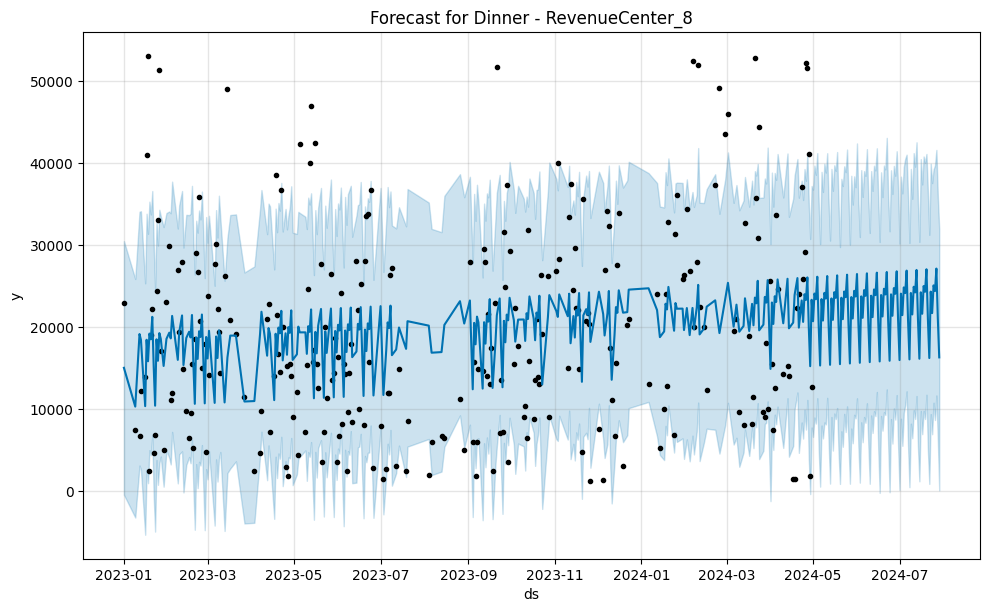

08:55:15 - cmdstanpy - INFO - Chain [1] start processing
08:55:15 - cmdstanpy - INFO - Chain [1] done processing


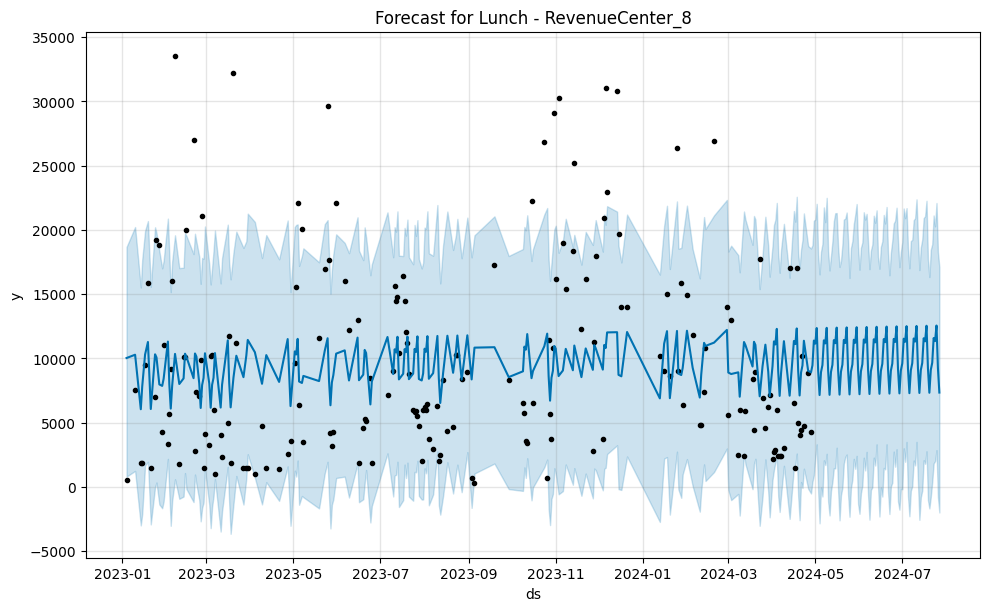

08:55:16 - cmdstanpy - INFO - Chain [1] start processing
08:55:16 - cmdstanpy - INFO - Chain [1] done processing


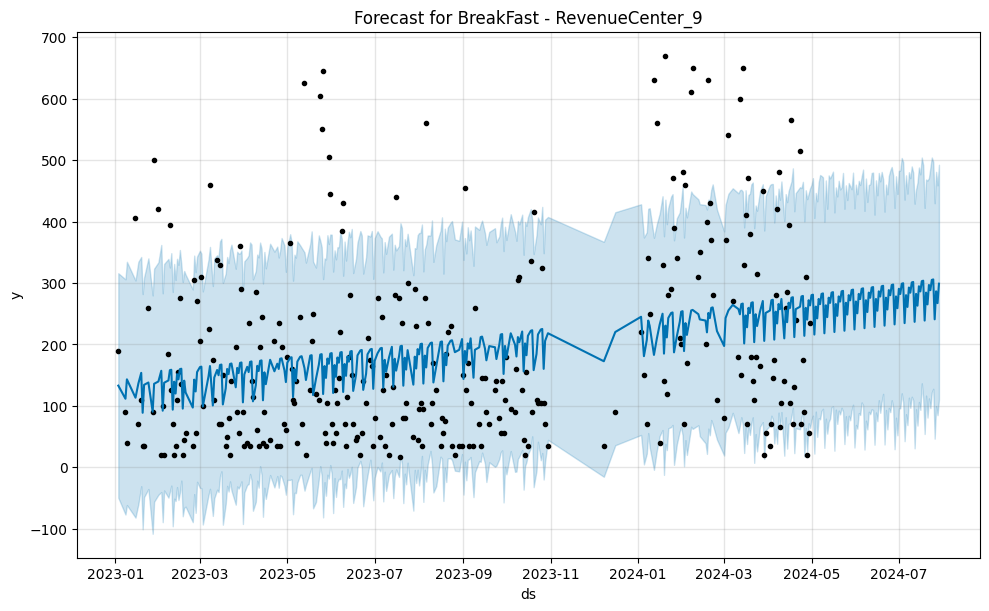

08:55:16 - cmdstanpy - INFO - Chain [1] start processing
08:55:16 - cmdstanpy - INFO - Chain [1] done processing


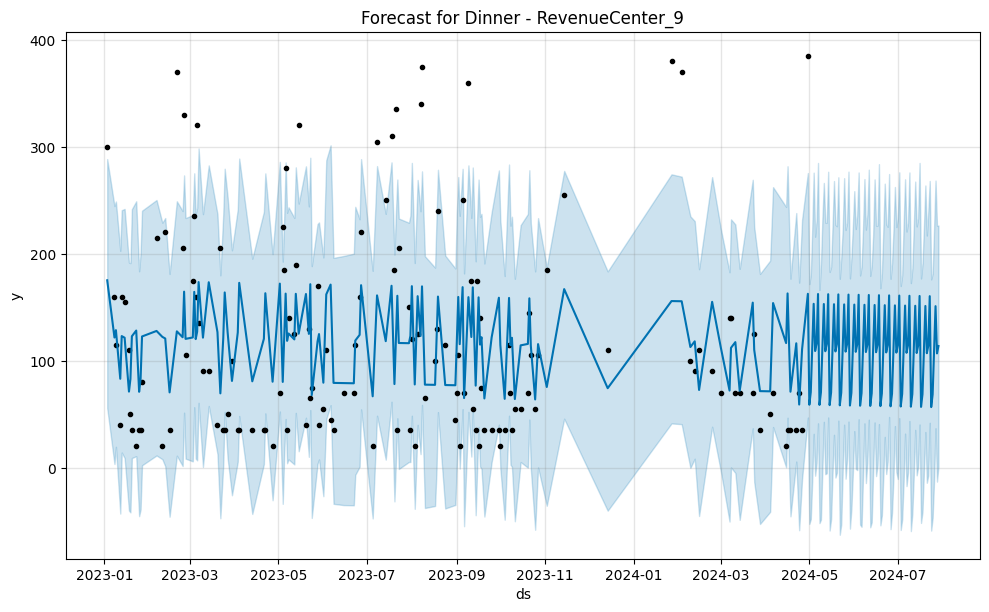

08:55:17 - cmdstanpy - INFO - Chain [1] start processing
08:55:17 - cmdstanpy - INFO - Chain [1] done processing


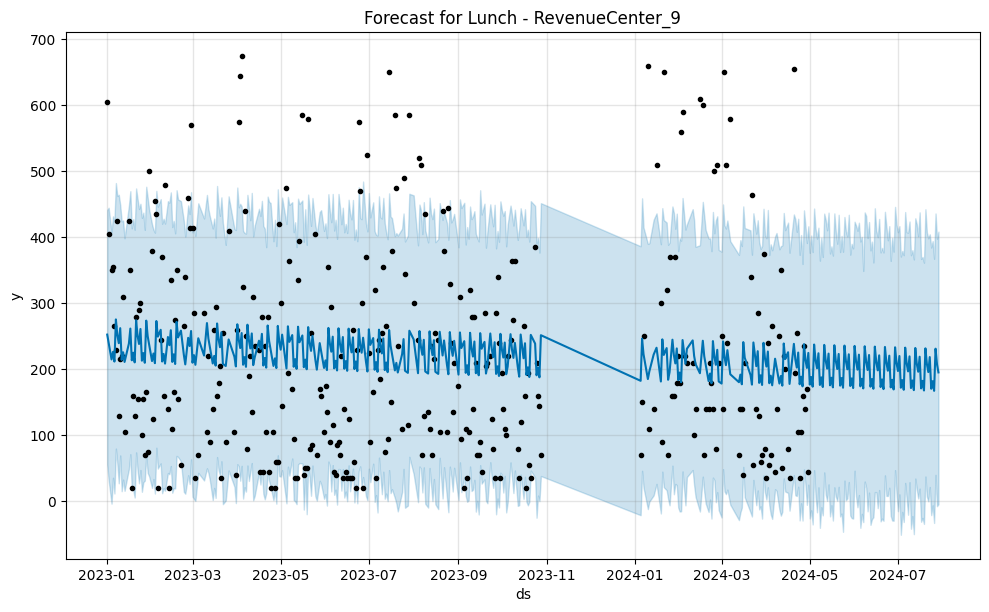

08:55:17 - cmdstanpy - INFO - Chain [1] start processing
08:55:17 - cmdstanpy - INFO - Chain [1] done processing


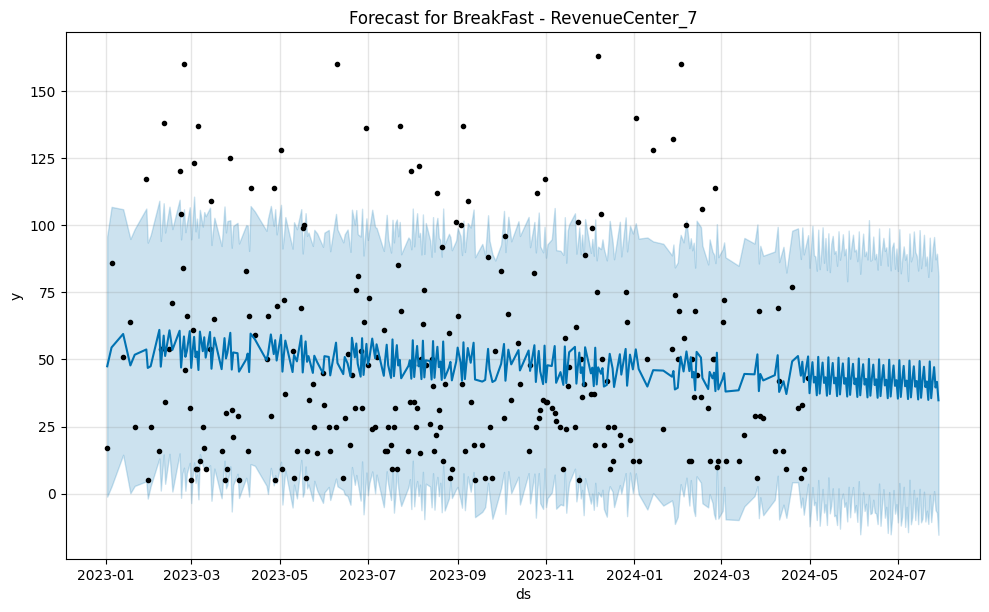

08:55:18 - cmdstanpy - INFO - Chain [1] start processing
08:55:18 - cmdstanpy - INFO - Chain [1] done processing


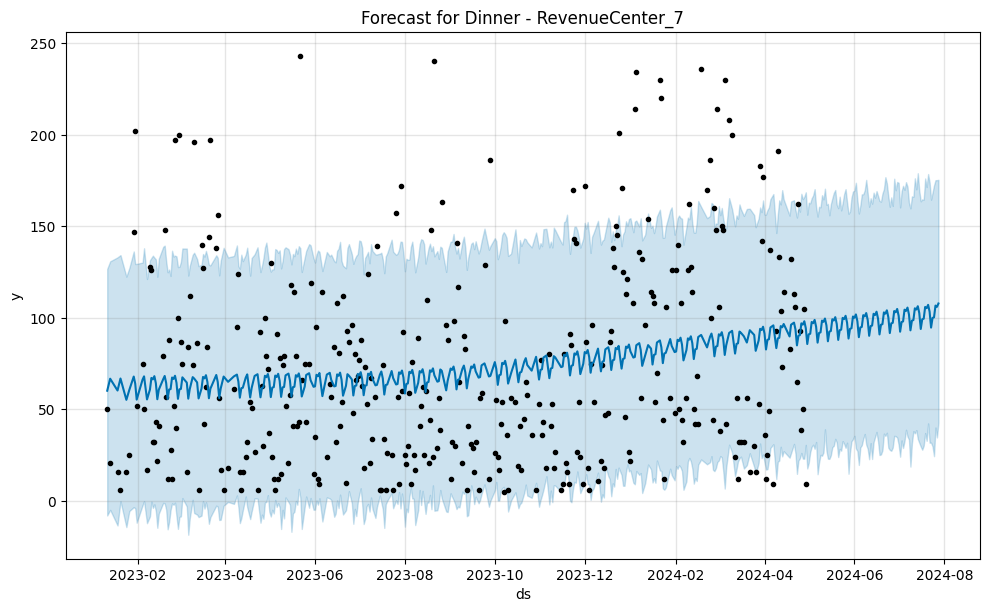

08:55:18 - cmdstanpy - INFO - Chain [1] start processing
08:55:18 - cmdstanpy - INFO - Chain [1] done processing


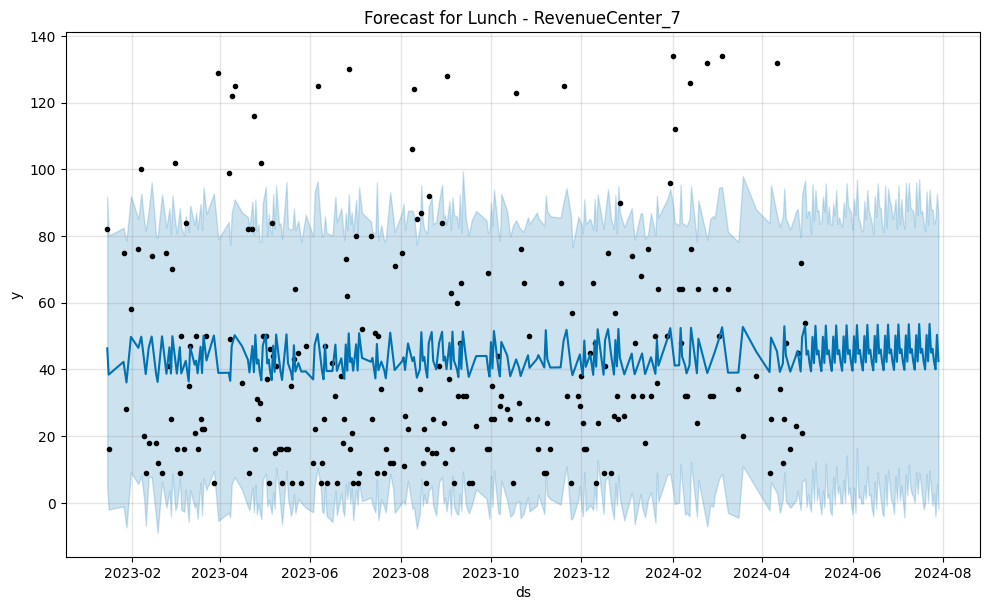

In [176]:
results = []
for clean_df in cleaned_df_list:
    meal = clean_df["MealPeriod"].unique()[0]
    center = clean_df["RevenueCenterName"].unique()[0]
    temp = clean_df[['Date', 'CheckTotal']].rename(columns={'Date': 'ds', 'CheckTotal': 'y'})
    if len(temp) < 30:
        continue # Skip too short time series    
    model, forecast = forecast_prophet(temp)

    # Evaluate on last 30 days
    merged = pd.merge(temp, forecast[['ds', 'yhat']], on='ds', how='left')
    merged = merged.dropna()
    rmse = np.sqrt(mean_squared_error(merged['y'], merged['yhat']))
    mae = mean_absolute_error(merged['y'], merged['yhat'])
    mape = np.mean(np.abs((merged['y'] - merged['yhat']) / merged['y'])) * 100

    
    results.append({
        'MealPeriod': meal,
        'RevenueCenterName': center,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape
    })
    # Optional plot
    model.plot(forecast)
    plt.title(f'Forecast for {meal} - {center}')
    plt.show()

    

In [177]:

results_df = pd.DataFrame(results).sort_values(by=['RevenueCenterName', 'MealPeriod'])

print("Summary of Forecasting Errors:")
print(results_df.sort_values('RMSE'))


Summary of Forecasting Errors:
   MealPeriod RevenueCenterName          RMSE          MAE        MAPE
23      Lunch   RevenueCenter_7     32.559197    26.004845  121.407308
21  BreakFast   RevenueCenter_7     37.073139    29.891575  136.009847
22     Dinner   RevenueCenter_7     53.879651    43.636682  155.720802
19     Dinner   RevenueCenter_9     90.864076    72.162708  109.871979
18  BreakFast   RevenueCenter_9    148.517275   116.421554  135.599367
9   BreakFast   RevenueCenter_6    150.022232   122.535622  133.139378
20      Lunch   RevenueCenter_9    157.690921   126.879581  129.614062
3   BreakFast   RevenueCenter_2    224.911661   178.963970  111.487763
5       Lunch   RevenueCenter_2    250.787085   200.370594  122.935747
12  BreakFast   RevenueCenter_3    255.142068   206.977444  169.316528
11      Lunch   RevenueCenter_6    273.668743   221.614300  170.270683
4      Dinner   RevenueCenter_2    281.132350   224.375880  121.392329
10     Dinner   RevenueCenter_6    340.764044 

In [178]:
cleaned_df_list[0]

,index,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week
0,0,2023-01-01,BreakFast,RevenueCenter_1,1499.4,6,1,52
1,16,2023-01-02,BreakFast,RevenueCenter_1,771.0,0,1,1
2,33,2023-01-03,BreakFast,RevenueCenter_1,1302.4,1,1,1
3,51,2023-01-04,BreakFast,RevenueCenter_1,1737.0,2,1,1
4,69,2023-01-05,BreakFast,RevenueCenter_1,653.0,3,1,1
...,...,...,...,...,...,...,...,...
480,9120,2024-04-26,BreakFast,RevenueCenter_1,1005.0,4,4,17
481,9142,2024-04-27,BreakFast,RevenueCenter_1,736.0,5,4,17
482,9163,2024-04-28,BreakFast,RevenueCenter_1,863.0,6,4,17
483,9184,2024-04-29,BreakFast,RevenueCenter_1,1064.7,0,4,18


############################################# Let's Use Sarimax #####################################################

In [179]:
%pip install pmdarima


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [180]:
cleaned_df_list[1]["MealPeriod"].unique()

array(['Dinner'], dtype=object)

In [181]:
sarima_df_list = []
for df in cleaned_df_list:
    df['Date'] = pd.to_datetime(df['Date'])  # ensure datetime
    df = df.set_index('Date')

    # Extract unique values before reindexing
    meal_period = df['MealPeriod'].unique()[0]
    revenue_center = df['RevenueCenterName'].unique()[0]

    # Create continuous date range from min to max date
    full_idx = pd.date_range(start="2023-01-01", end="2024-04-30", freq='D')

    # Reindex to full date range (adds missing dates with NaN)
    df = df.reindex(full_idx)
    df.index.name = "Date"

    # Fill missing values in the specific columns
    df['MealPeriod'] = df['MealPeriod'].fillna(meal_period)
    df['RevenueCenterName'] = df['RevenueCenterName'].fillna(revenue_center)

    df = df.reset_index()
    df = df.drop("index", axis = 1)
    sarima_df_list.append(df)


In [182]:
sarima_df_list[0]

,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week
0,2023-01-01,BreakFast,RevenueCenter_1,1499.4,6.0,1.0,52
1,2023-01-02,BreakFast,RevenueCenter_1,771.0,0.0,1.0,1
2,2023-01-03,BreakFast,RevenueCenter_1,1302.4,1.0,1.0,1
3,2023-01-04,BreakFast,RevenueCenter_1,1737.0,2.0,1.0,1
4,2023-01-05,BreakFast,RevenueCenter_1,653.0,3.0,1.0,1
...,...,...,...,...,...,...,...
481,2024-04-26,BreakFast,RevenueCenter_1,1005.0,4.0,4.0,17
482,2024-04-27,BreakFast,RevenueCenter_1,736.0,5.0,4.0,17
483,2024-04-28,BreakFast,RevenueCenter_1,863.0,6.0,4.0,17
484,2024-04-29,BreakFast,RevenueCenter_1,1064.7,0.0,4.0,18


In [183]:
sarima_df_list[10]["CheckTotal"].isna().sum()

51

In [184]:
i = 0
for df in sarima_df_list:
    sarima_df_list[i]['IsMissing'] = df['CheckTotal'].isna().astype(int)
    i = i+1


In [185]:
sarima_df_list[0]


,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week,IsMissing
0,2023-01-01,BreakFast,RevenueCenter_1,1499.4,6.0,1.0,52,0
1,2023-01-02,BreakFast,RevenueCenter_1,771.0,0.0,1.0,1,0
2,2023-01-03,BreakFast,RevenueCenter_1,1302.4,1.0,1.0,1,0
3,2023-01-04,BreakFast,RevenueCenter_1,1737.0,2.0,1.0,1,0
4,2023-01-05,BreakFast,RevenueCenter_1,653.0,3.0,1.0,1,0
...,...,...,...,...,...,...,...,...
481,2024-04-26,BreakFast,RevenueCenter_1,1005.0,4.0,4.0,17,0
482,2024-04-27,BreakFast,RevenueCenter_1,736.0,5.0,4.0,17,0
483,2024-04-28,BreakFast,RevenueCenter_1,863.0,6.0,4.0,17,0
484,2024-04-29,BreakFast,RevenueCenter_1,1064.7,0.0,4.0,18,0


In [186]:
#Handle missing values using linear interpolation

sarima_complete_df_list = []
for df in sarima_df_list:
    df['CheckTotal'] = df['CheckTotal'].interpolate(method='linear')
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['Month'] = df['Date'].dt.month
    df['Week'] = df['Date'].dt.isocalendar().week
    df = df.dropna(subset=["CheckTotal"])
    sarima_complete_df_list.append(df)




In [187]:
sarima_complete_df_list[0]

,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week,IsMissing
0,2023-01-01,BreakFast,RevenueCenter_1,1499.4,6,1,52,0
1,2023-01-02,BreakFast,RevenueCenter_1,771.0,0,1,1,0
2,2023-01-03,BreakFast,RevenueCenter_1,1302.4,1,1,1,0
3,2023-01-04,BreakFast,RevenueCenter_1,1737.0,2,1,1,0
4,2023-01-05,BreakFast,RevenueCenter_1,653.0,3,1,1,0
...,...,...,...,...,...,...,...,...
481,2024-04-26,BreakFast,RevenueCenter_1,1005.0,4,4,17,0
482,2024-04-27,BreakFast,RevenueCenter_1,736.0,5,4,17,0
483,2024-04-28,BreakFast,RevenueCenter_1,863.0,6,4,17,0
484,2024-04-29,BreakFast,RevenueCenter_1,1064.7,0,4,18,0


In [188]:
sarima_complete_df_list[0].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 486 entries, 0 to 485
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               486 non-null    datetime64[ns]
 1   MealPeriod         486 non-null    object        
 2   RevenueCenterName  486 non-null    object        
 3   CheckTotal         486 non-null    float64       
 4   DayOfWeek          486 non-null    int32         
 5   Month              486 non-null    int32         
 6   Week               486 non-null    UInt32        
 7   IsMissing          486 non-null    int32         
dtypes: UInt32(1), datetime64[ns](1), float64(1), int32(3), object(2)
memory usage: 23.4+ KB


In [189]:
for df in sarima_complete_df_list:
    print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 486 entries, 0 to 485
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               486 non-null    datetime64[ns]
 1   MealPeriod         486 non-null    object        
 2   RevenueCenterName  486 non-null    object        
 3   CheckTotal         486 non-null    float64       
 4   DayOfWeek          486 non-null    int32         
 5   Month              486 non-null    int32         
 6   Week               486 non-null    UInt32        
 7   IsMissing          486 non-null    int32         
dtypes: UInt32(1), datetime64[ns](1), float64(1), int32(3), object(2)
memory usage: 23.4+ KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 486 entries, 0 to 485
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               486 non-nu

In [190]:
sarima_complete_df_list[0]

,Date,MealPeriod,RevenueCenterName,CheckTotal,DayOfWeek,Month,Week,IsMissing
0,2023-01-01,BreakFast,RevenueCenter_1,1499.4,6,1,52,0
1,2023-01-02,BreakFast,RevenueCenter_1,771.0,0,1,1,0
2,2023-01-03,BreakFast,RevenueCenter_1,1302.4,1,1,1,0
3,2023-01-04,BreakFast,RevenueCenter_1,1737.0,2,1,1,0
4,2023-01-05,BreakFast,RevenueCenter_1,653.0,3,1,1,0
...,...,...,...,...,...,...,...,...
481,2024-04-26,BreakFast,RevenueCenter_1,1005.0,4,4,17,0
482,2024-04-27,BreakFast,RevenueCenter_1,736.0,5,4,17,0
483,2024-04-28,BreakFast,RevenueCenter_1,863.0,6,4,17,0
484,2024-04-29,BreakFast,RevenueCenter_1,1064.7,0,4,18,0


In [191]:
import pmdarima as pm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

model_orders = []
models_list = []
results_list = []
evaluation_results = []


exog_features = ["DayOfWeek", "Month", "Week", "IsMissing"]

for df in sarima_complete_df_list:
    name = df["RevenueCenterName"].unique()[0]
    meal = df["MealPeriod"].unique()[0]

    # Split data
    train_df = df[(df["Date"] >= "2023-01-01") & (df["Date"] <= "2024-01-01")]
    test_df = df[df["Date"] > "2024-01-01"]

    y_train = train_df["CheckTotal"]
    y_test = test_df["CheckTotal"]


    X_train = train_df[exog_features]
    X_test = test_df[exog_features]


    # Fit auto_arima on training data
    auto_model = pm.auto_arima(y_train,
                               exog_features=X_train,
                                seasonal=True,
                                m=7,
                                stepwise=True,
                                trace=False,
                                error_action='ignore',
                                suppress_warnings=True)

    print(name, "-", meal)
    print(auto_model.summary())
    print()

    model_orders.append({
        "RevenueCenterName": name,
        "MealPeriod": meal,
        "order": auto_model.order,
        "seasonal_order": auto_model.seasonal_order
    })

    # Fit SARIMAX
    model = SARIMAX(y_train,
                    exog_features=X_train,
                    order=auto_model.order,
                    seasonal_order=auto_model.seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False)

    results = model.fit()
    models_list.append(model)
    results_list.append(results)

    # Forecast for test period
    n_periods = len(y_test)
    forecast = results.forecast(steps=n_periods, exog=X_test)

    # Compute Evaluation Metrics
    rmse = np.sqrt(mean_squared_error(y_test, forecast))
    mae = mean_absolute_error(y_test, forecast)
    mape = np.mean(np.abs((y_test - forecast) / y_test )) * 100

    evaluation_results.append({
        "RevenueCenterName": name,
        "MealPeriod": meal,
        "RMSE": rmse,
        "MAE": mae,
        "MAPE": mape
    })



    print("Evaluation for", name, "-", meal)
    print(f"RMSE: {rmse:.2f}, MAE: {mae:.2f}, MAPE: {mape:.2f}%")
    print("\n\n")


RevenueCenter_1 - BreakFast
                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  366
Model:             SARIMAX(3, 0, 0)x(1, 0, 0, 7)   Log Likelihood               -2745.653
Date:                           Sun, 20 Jul 2025   AIC                           5503.307
Time:                                   08:55:47   BIC                           5526.723
Sample:                                        0   HQIC                          5512.612
                                           - 366                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    430.0200     61.188      7.028      0.000     310.095     549.945
ar.L1          

In [192]:
# Convert list of dicts to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

#########################  Evaluation of SARIMA Models  ################################

In [193]:
evaluation_df.sort_values('MAPE')

,RevenueCenterName,MealPeriod,RMSE,MAE,MAPE
6,RevenueCenter_5,BreakFast,3998.494996,3558.911557,20.959372
13,RevenueCenter_3,Dinner,6030.472871,5355.829031,44.770977
23,RevenueCenter_7,Lunch,38.661639,27.572322,45.131294
14,RevenueCenter_3,Lunch,1040.211857,825.241968,45.227306
7,RevenueCenter_5,Dinner,6340.385437,4732.598370,50.014788
20,RevenueCenter_9,Lunch,241.574406,178.568750,60.376103
18,RevenueCenter_9,BreakFast,245.346286,190.618183,66.109594
1,RevenueCenter_1,Dinner,2522.179595,2255.220715,68.023415
19,RevenueCenter_9,Dinner,101.772584,80.585245,72.811802
11,RevenueCenter_6,Lunch,330.939409,261.732815,76.315431


########################   Plottings, ADF test 

In [194]:
#Use ADF Test for stationarity

from statsmodels.tsa.stattools import adfuller

for df in sarima_complete_df_list:
    y = df["CheckTotal"]
    result = adfuller(y)
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])


ADF Statistic: -3.5626328497304396
p-value: 0.0065169293707212335
ADF Statistic: -3.368530357818983
p-value: 0.012079609096466548
ADF Statistic: -5.3817960281436585
p-value: 3.698524260176917e-06
ADF Statistic: -4.914211861863072
p-value: 3.2719724218734485e-05
ADF Statistic: -3.514401296266204
p-value: 0.007624850135231547
ADF Statistic: -9.678652311272295
p-value: 1.221334911697194e-16
ADF Statistic: -3.249555345701947
p-value: 0.017289540279327654
ADF Statistic: -3.375562827399554
p-value: 0.01182068305694865
ADF Statistic: -4.585744166736407
p-value: 0.00013721446672201014
ADF Statistic: -5.817497468372434
p-value: 4.258563519075808e-07
ADF Statistic: -17.236447314867174
p-value: 6.146037221254751e-30
ADF Statistic: -3.746695949056541
p-value: 0.0035022705061009537
ADF Statistic: -14.704724890127824
p-value: 2.9094568512353333e-27
ADF Statistic: -2.353296894562314
p-value: 0.15535400727985194
ADF Statistic: -4.195780397258554
p-value: 0.0006698211420102661
ADF Statistic: -4.3402605

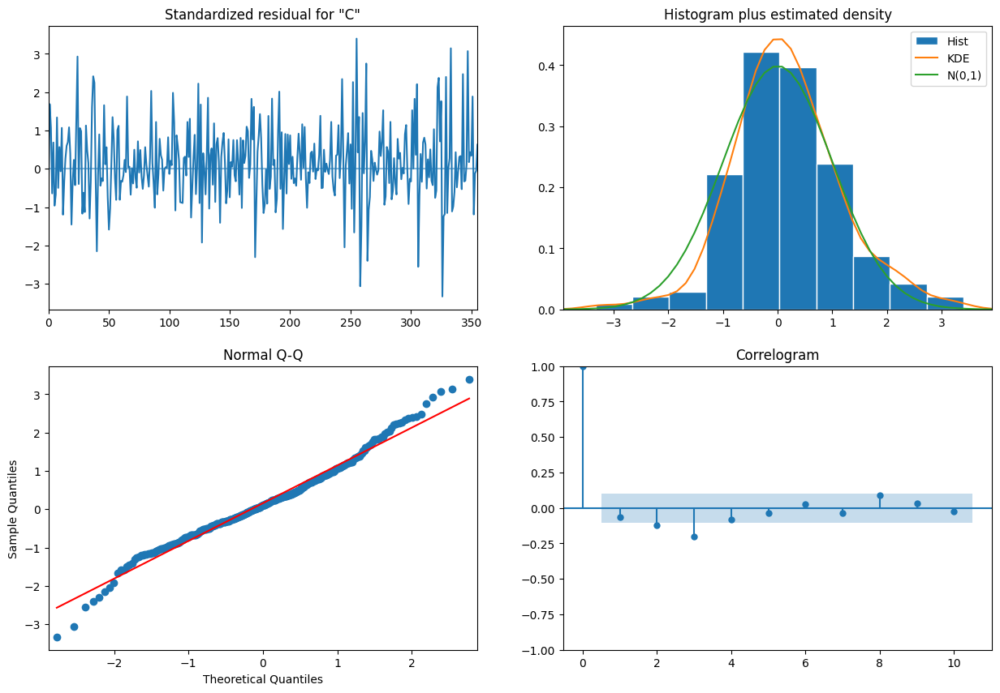

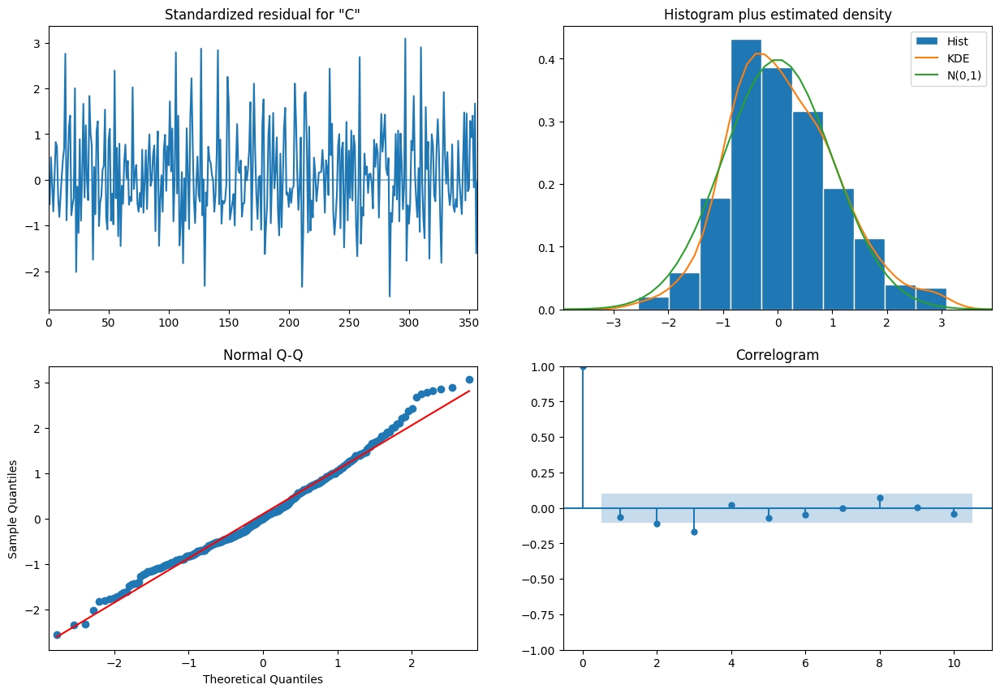

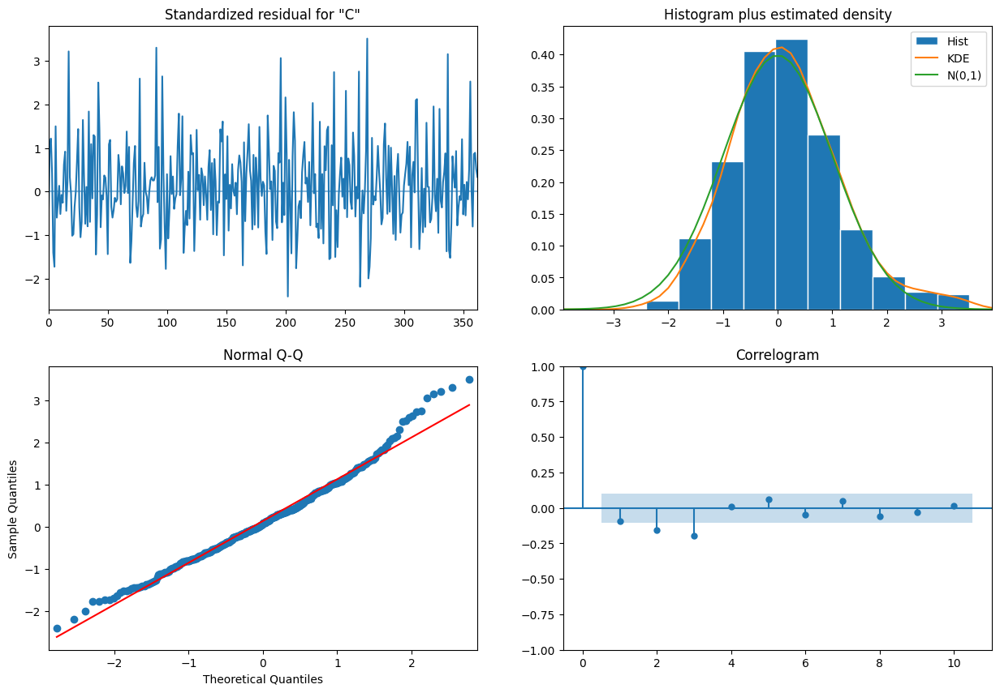

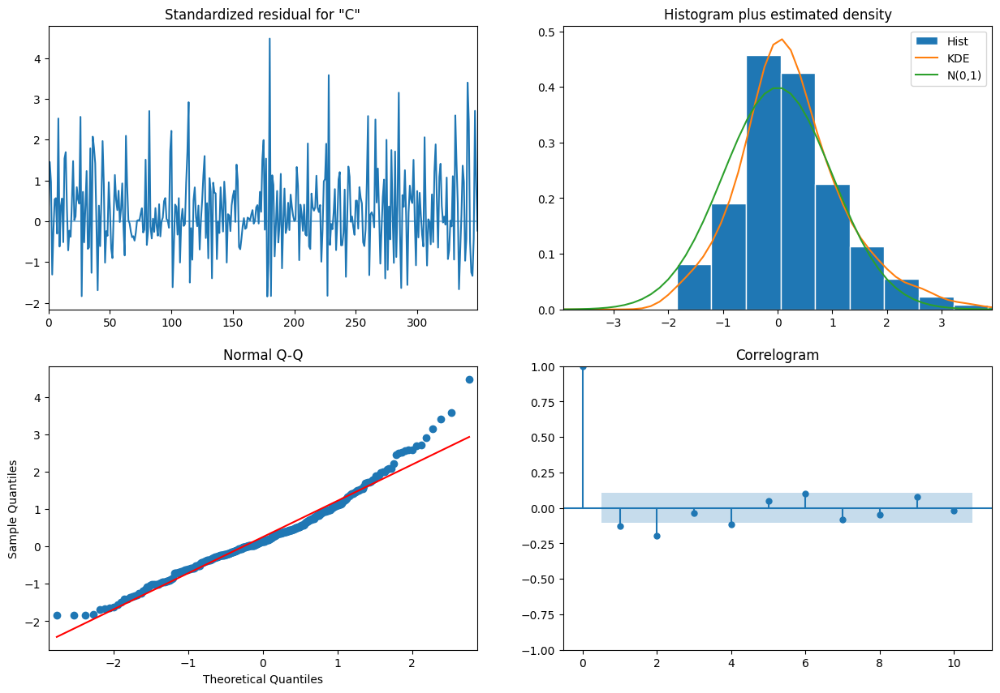

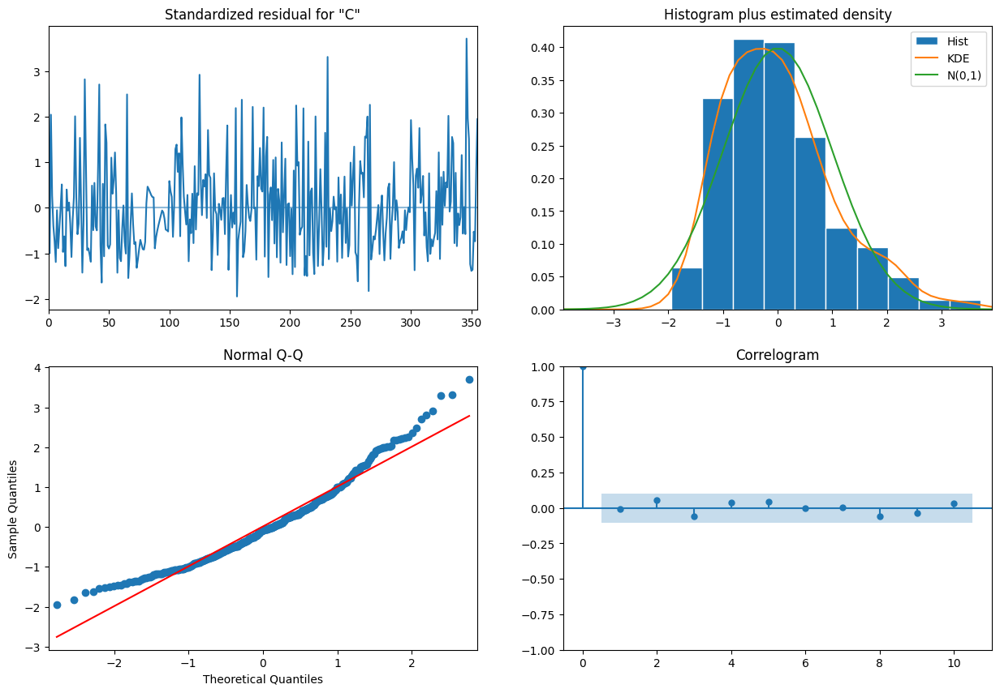

...

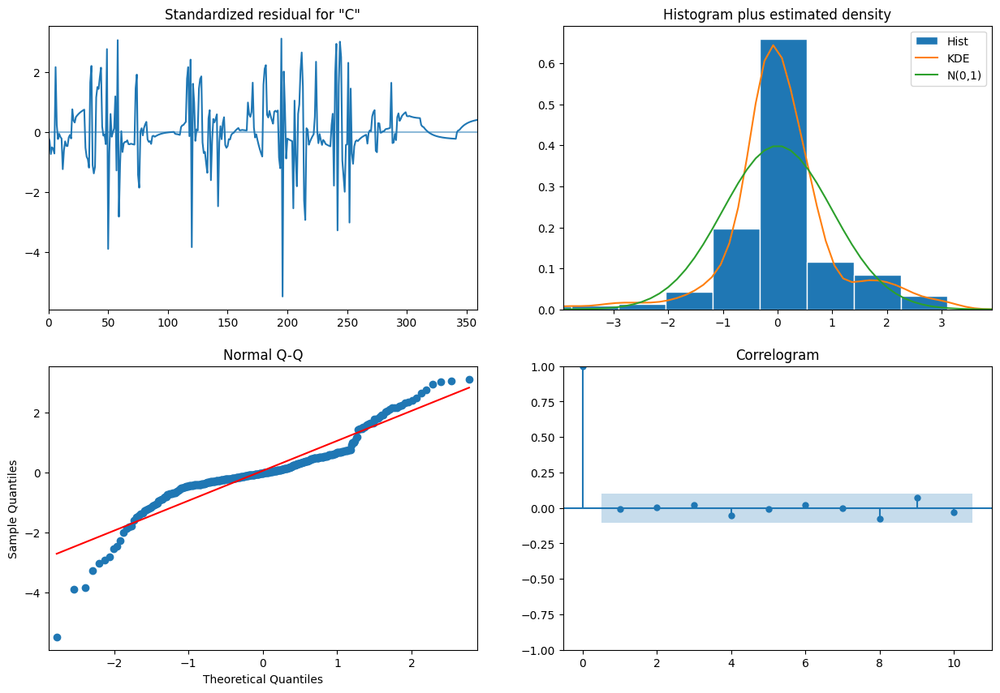

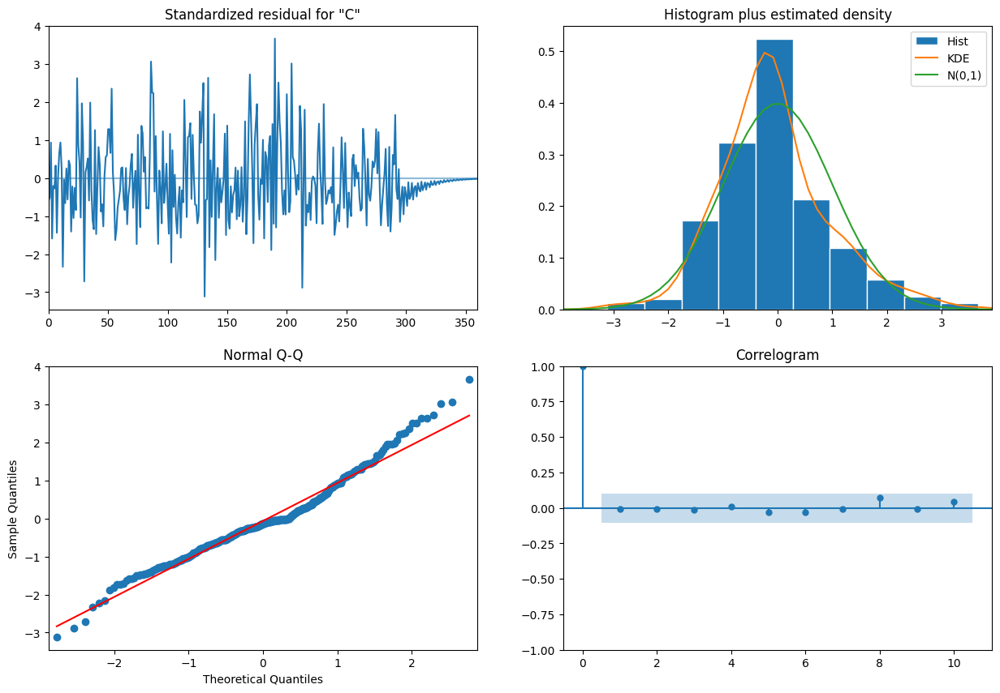

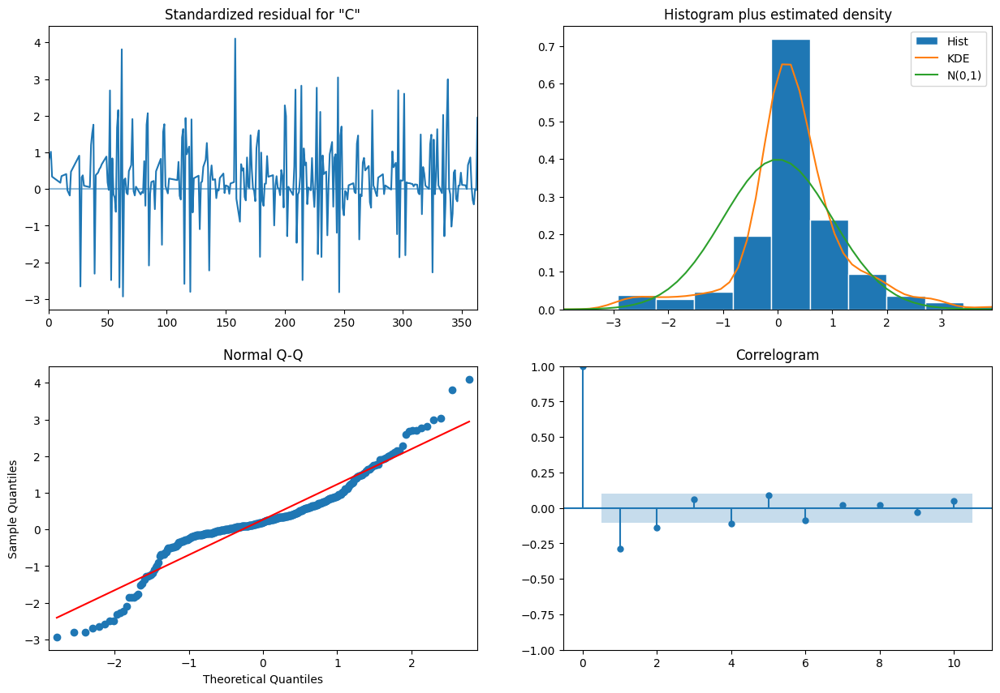

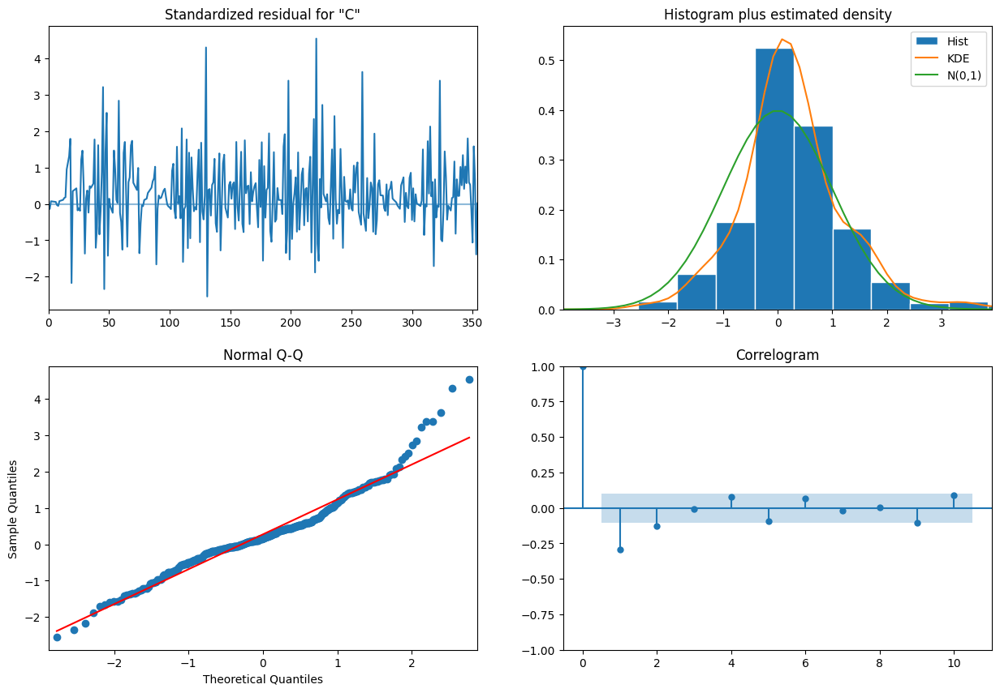

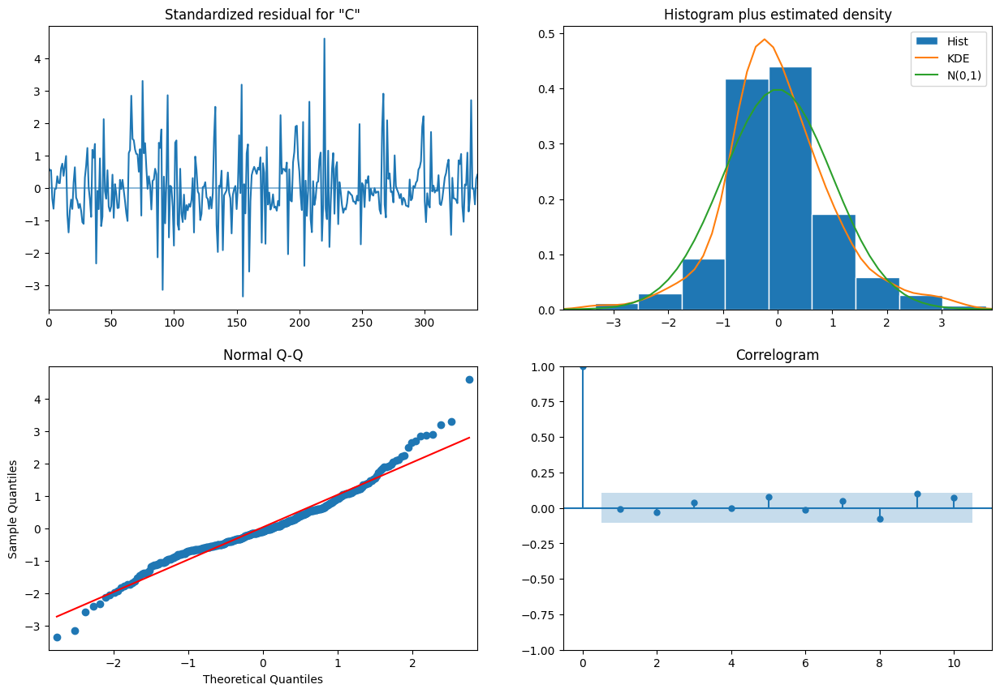

In [195]:
#Diagnose the model

for results in results_list:
    #print(results.summary())
    results.plot_diagnostics(figsize=(15, 10))
    plt.show()

    print("\n\n")


In [196]:
#Ljung box test on residuals

from statsmodels.stats.diagnostic import acorr_ljungbox
lb_test = acorr_ljungbox(results.resid, lags=[10], return_df=True)
print(lb_test)


     lb_stat  lb_pvalue
10  9.725695    0.46488
